<img src="https://www.nus.edu.sg/images/default-source/identity-images/NUS_logo_full-horizontal.jpg" style="float: left; margin: 5px; height: 120px">

# DSA5344_Group33: Track 2: Loan-level Anomaly Detection for Repayment Behavior
#### Members: Jia Sheng |  Hu Qingxuan | Gong Zihong

 - [Problem Statement](#Problem-Statement)
 - [Executive Summary](#Executive-Summary)
 - [Methodology](#Methodology)
 - [Datasets](#Datasets)
 - [Data Import](#Data-Import)
 - [Exploratory Data Analysis](#Exploratory-Data-Analysis)
 - [Citations and Sources](#Citations-and-Sources)

## Problem Statement

Financial institutions face significant losses from loan defaults each year. Current credit scoring models primarily evaluate borrower characteristics at loan origination, missing behavioral patterns that emerge during the repayment lifecycle. Typical credit scoring models are developed from static windows, and are therefore quite insensitive to changes, such as population changes or disturbances in periods of major financial distress (Sousa et al., 2016).

This project develops machine learning models (non-deep learning models) to detect abnormal repayment behavior by analyzing both static borrower information and temporal payment sequences. The approach combines domain-specific feature engineering with ensemble anomaly detection models.
The objective is to identify loans that will eventually miss scheduled payments by analyzing their repayment trajectories and borrower characteristics. Each loan contains static features (borrower demographics, loan terms, credit scores) and temporal sequences representing monthly loan status and balance information over exactly 14 months. The target variable indicates payment outcomes, where 0 represents successful payment and 1 represents default

The primary challenges include severe class imbalance (only 12.6% of validation loans are problematic), mixed data types, and computational efficiency requirements for processing/training large loan dataset with unsupervised models. This Kaggle competition focuses on Average Precision over AUC for imbalanced data. This makes sense as high precision reduces the business cost of wrongly flagging good customers as defaults.


## Methodology 

Following Blitzstein & Pfister’s workflow, a 5 steps framework was implemented to conduct this analysis. These 5 steps are:

**Step 1: Ask an interesting question**
- Defining a clear and concise problem statement.

**Step 2: Get the data**
- Import and clean raw data to ensure that all datatypes were accurate and any other errors were fixed.

**Step 3: Explore the data**
- Check for duplicated and missing data
- Plot visualization for distribution of posts of datasets
- Temporal patterns, Time-Series Patterns
- Correlation Analysis
- Feature engineering

**Step 4: Model the data**
- Creating a base model with Isolation Forest model
- Compare success metrics between the different unsupervised / semi supervised models after hyperparameters tuning
- Selecting the best Machine learning algorithm/model selection for submission
- Model intepretation
- SHAP summary plot

**Step 5: Communicate and visualize results**
- Present findings to a non-technical audience and provide recommendations

## Datasets

#### Index and Target Variables

| Column Name | Description |
|------------|-------------|
| **index** | Unique identifier assigned to each loan. |
| **target** | Binary label indicating loan performance outcome (for this project setting):<br>• `0` = normal loan (no default)<br>• `1` = abnormal loan (default or anomalous event) |

#### Origination Variables

Static loan and borrower information captured at the time of origination.

| Column Name | Description |
|------------|-------------|
| **CreditScore** | Borrower credit score at origination (300–850). Values outside range or missing coded as `9999`. |
| **FirstPaymentDate** | First scheduled payment due date (YYYYMM format). |
| **FirstTimeHomebuyerFlag** | First-time homebuyer indicator:<br>• `Y` = Yes<br>• `N` = No<br>• `9` = Not Available |
| **MaturityDate** | Scheduled maturity date (YYYYMM format). |
| **MSA** | Metropolitan Statistical Area code (`null` if unknown). |
| **MI_Pct** | Mortgage insurance percentage:<br>• `0` = none<br>• `1–55` = coverage %<br>• `999` = not available |
| **NumberOfUnits** | Number of dwelling units (1–4). |
| **OccupancyStatus** | Occupancy type:<br>• `P` = Primary Residence<br>• `I` = Investment Property<br>• `S` = Second Home<br>• `9` = Not Available |
| **OriginalCLTV** | Combined Loan-to-Value ratio at origination (%). |
| **OriginalDTI** | Debt-to-Income ratio (%). Values > 65% or missing coded as `999`. |
| **OriginalUPB** | Original unpaid principal balance (nearest $1,000). |
| **OriginalLTV** | Loan-to-Value ratio at origination (%). Invalid values coded as `999`. |
| **OriginalInterestRate** | Note rate at origination (%). |
| **Channel** | Origination channel:<br>• `R` = Retail<br>• `B` = Broker<br>• `C` = Correspondent<br>• `T` = TPO Not Specified<br>• `9` = Not Available |
| **PPM_Flag** | Prepayment penalty indicator:<br>• `Y` = Yes<br>• `N` = No |
| **ProductType** | Loan product type:<br>• `FRM` = Fixed Rate Mortgage<br>• `ARM` = Adjustable Rate Mortgage |
| **PropertyState** | Two-letter state/territory code (e.g., CA, NY, TX). |
| **PropertyType** | Property type:<br>• `SF` = Single-Family<br>• `CO` = Condo<br>• `PU` = PUD (Planned Unit Development)<br>• `MH` = Manufactured Housing<br>• `CP` = Co-op<br>• `99` = Not Available |
| **PostalCode** | Masked ZIP code (first 3 digits + "00"). |
| **LoanPurpose** | Purpose of the loan:<br>• `P` = Purchase<br>• `C` = Refinance Cash Out<br>• `N` = Refinance No Cash Out<br>• `R` = Refinance Not Specified<br>• `9` = Not Available |
| **OriginalLoanTerm** | Scheduled term in months (e.g., 180, 360). |
| **NumberOfBorrowers** | Number of borrowers on the loan (1–10). |
| **SellerName** | Entity that sold the loan to Freddie Mac. "Other Sellers" used if below disclosure threshold. |
| **ServicerName** | Entity servicing the loan. "Other Servicers" used if below disclosure threshold. |
| **SuperConformingFlag** | Indicates whether loan exceeded conforming limits but qualified as "super conforming". |
| **PreHARP_Flag** | Indicator for pre-HARP program status. |
| **ProgramIndicator** | Indicator for special loan programs. |
| **ReliefRefinanceIndicator** | Indicator for HARP and related refinance programs. |
| **PropertyValMethod** | Appraisal method used:<br>• `1` = ACE (Automated Collateral Evaluation)<br>• `2` = Full Appraisal<br>• `3` = Other (Desktop/AVM)<br>• `4` = ACE + PDR |
| **InterestOnlyFlag** | Interest-only payment indicator:<br>• `Y` = interest-only payments required<br>• `N` = standard amortization |
| **BalloonIndicator** | Balloon payment indicator:<br>• `Y` = balloon payment required<br>• `N` = no balloon payment |

#### Performance Panel Variables

Monthly performance data tracked across the life of each loan. Each loan has multiple time periods, indexed by **N** where N = 0, 1, 2, ... represents the month number.

#### Repeated Fields for Each Month N:

| Column Pattern | Description |
|---------------|-------------|
| **N_CurrentActualUPB** | Current unpaid principal balance (UPB) for month N, including both interest-bearing and non-interest-bearing portions. |
| **N_CurrentInterestRate** | Mortgage interest rate in effect for month N (%). |
| **N_CurrentNonInterestBearingUPB** | Non-interest-bearing portion of UPB for month N (e.g., deferred modification amounts). |
| **N_EstimatedLTV** | Current estimated Loan-to-Value ratio (ELTV) for month N from Freddie Mac's AVM.<br>• Range: 1–998<br>• `999` = unknown |
| **N_InterestBearingUPB** | Portion of UPB that accrues interest for month N. |
| **N_LoanAge** | Number of months since the loan's first payment date (or modification date) as of month N. |
| **N_MonthlyReportingPeriod** | Period identifier in YYYYMM format for month N. |
| **N_RemainingMonthsToLegalMaturity** | Remaining months until scheduled maturity (adjusted if modified) as of month N. |

##### Example:
- `0_CurrentActualUPB` = UPB at month 0 (first observation)
- `1_CurrentActualUPB` = UPB at month 1
- `13_CurrentActualUPB` = UPB at month 13

#### Important Notes

##### Data Structure
- **Origination variables** provide static background information (borrower credit, loan terms, property characteristics).
- **Performance panel** makes this a **longitudinal dataset**: each loan is tracked monthly until payoff, maturity, or default.

##### Data Quality Indicators
- **9999** = Missing or invalid CreditScore
- **999** = Missing or invalid DTI, LTV, or MI_Pct
- **9** = Not Available for categorical flags
- **null** = Unknown MSA or other missing categorical data

##### Time-Series Characteristics
- Each loan has a variable number of observation months (up to 14 months in this dataset: months 0–13)
- Monthly snapshots capture the evolution of loan performance over time
- Performance variables allow tracking of payment behavior, principal reduction, and risk metrics

## Data Import

In [2]:
# !pip install sweetviz setuptools seaborn scikit-learn plotly ydata-profiling

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# Advanced libraries
import sweetviz as sv
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import StandardScaler
from sklearn.inspection import permutation_importance
from sklearn.model_selection import cross_val_score
from sklearn.metrics import average_precision_score, precision_recall_curve
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from ydata_profiling import ProfileReport

# Set style
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")

In [5]:
train_df = pd.read_csv('/home/ubuntu/DS/Track2/loans_train.csv', low_memory=False)
valid_df = pd.read_csv('/home/ubuntu/DS/Track2/loans_valid.csv', low_memory=False)
test_df = pd.read_csv('/home/ubuntu/DS/Track2/loans_test.csv', low_memory=False)

In [3]:
train_df.head()

,index,target,CreditScore,FirstPaymentDate,FirstTimeHomebuyerFlag,MaturityDate,MSA,MI_Pct,NumberOfUnits,OccupancyStatus,...,12_MonthlyReportingPeriod,12_RemainingMonthsToLegalMaturity,13_CurrentActualUPB,13_CurrentInterestRate,13_CurrentNonInterestBearingUPB,13_EstimatedLTV,13_InterestBearingUPB,13_LoanAge,13_MonthlyReportingPeriod,13_RemainingMonthsToLegalMaturity
0,0,0,747,202403,N,205402,NaN,0,1,P,...,202502,348,81190.87,8.000,0.0,999,81190.87,13,202503,347
1,1,0,659,202403,N,205402,NaN,0,1,P,...,202502,348,301932.72,7.875,0.0,64,301932.72,13,202503,347
2,3,0,775,202403,N,205402,46540.0,0,2,I,...,202502,348,152044.42,7.625,0.0,999,152044.42,13,202503,347
3,4,0,815,202403,Y,205402,NaN,25,1,P,...,202502,348,50045.91,7.250,0.0,70,50045.91,13,202503,347
4,6,0,772,202403,N,205402,10900.0,0,1,P,...,202502,348,153521.39,7.750,0.0,63,153521.39,13,202503,347


In [4]:
valid_df.head()

,index,target,CreditScore,FirstPaymentDate,FirstTimeHomebuyerFlag,MaturityDate,MSA,MI_Pct,NumberOfUnits,OccupancyStatus,...,12_MonthlyReportingPeriod,12_RemainingMonthsToLegalMaturity,13_CurrentActualUPB,13_CurrentInterestRate,13_CurrentNonInterestBearingUPB,13_EstimatedLTV,13_InterestBearingUPB,13_LoanAge,13_MonthlyReportingPeriod,13_RemainingMonthsToLegalMaturity
0,2,0,784,202403,N,205402,46540.0,0,1,P,...,202502,348,123552.68,6.750,0.0,69,123552.68,13,202503,347
1,11,0,786,202403,N,205402,15764.0,25,1,P,...,202502,348,605030.78,7.000,0.0,71,605030.78,13,202503,347
2,22,0,739,202403,N,205402,36540.0,0,1,P,...,202502,348,158234.13,7.000,0.0,21,158234.13,13,202503,347
3,38,0,773,202403,N,205402,NaN,0,1,P,...,202502,348,155843.09,6.875,0.0,58,155843.09,13,202503,347
4,39,0,736,202403,Y,205402,NaN,25,1,P,...,202502,348,66226.11,7.250,0.0,88,66226.11,13,202503,347


## Exploratory Data Analysis

In [5]:
datasets = [(train_df,'train_df'), (valid_df,'valid_df')]

In [6]:
for dataset, name in datasets:
    print(f"Datasets Statstic for: {name}")
    print(f"Shape: {dataset.shape}")
    print(f"Null Values: {dataset.isnull().sum()}")
    print("Duplicated rows:")
    print(f"{dataset[dataset.duplicated()].count()}")
    print('--------------------------------------------------------------')

Datasets Statstic for: train_df
Shape: (30504, 145)
Null Values: index                                0
target                               0
CreditScore                          0
FirstPaymentDate                     0
FirstTimeHomebuyerFlag               0
                                    ..
13_EstimatedLTV                      0
13_InterestBearingUPB                0
13_LoanAge                           0
13_MonthlyReportingPeriod            0
13_RemainingMonthsToLegalMaturity    0
Length: 145, dtype: int64
Duplicated rows:
index                                0
target                               0
CreditScore                          0
FirstPaymentDate                     0
FirstTimeHomebuyerFlag               0
                                    ..
13_EstimatedLTV                      0
13_InterestBearingUPB                0
13_LoanAge                           0
13_MonthlyReportingPeriod            0
13_RemainingMonthsToLegalMaturity    0
Length: 145, dtype: int64
--------

#### Value Counts Target Variable for Train dataset

In [7]:
train_df.target.value_counts(normalize=True)

target
0    1.0
Name: proportion, dtype: float64

#### Value Counts Target Variable for Validation dataset

In [8]:
valid_df.target.value_counts(normalize=True)

target
0    0.873929
1    0.126071
Name: proportion, dtype: float64

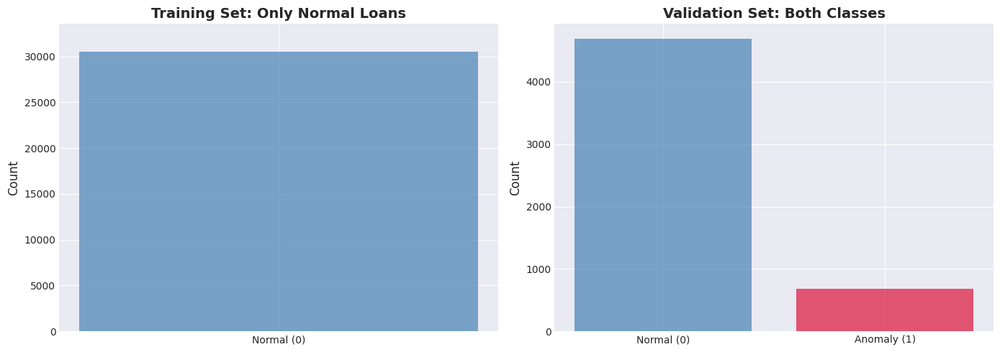

In [9]:
# Visualize class distribution
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Training
axes[0].bar(['Normal (0)'], [len(train_df)], color='steelblue', alpha=0.7)
axes[0].set_ylabel('Count', fontsize=12)
axes[0].set_title('Training Set: Only Normal Loans', fontsize=14, fontweight='bold')
axes[0].set_ylim(0, len(train_df) * 1.1)

# Validation
valid_counts = valid_df['target'].value_counts().sort_index()
axes[1].bar(['Normal (0)', 'Anomaly (1)'], valid_counts.values, 
            color=['steelblue', 'crimson'], alpha=0.7)
axes[1].set_ylabel('Count', fontsize=12)
axes[1].set_title('Validation Set: Both Classes', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.show()

#### Missing Values

TOP 20 FEATURES WITH MISSING VALUES:
                          Missing_Count  Missing_Percentage
ReliefRefinanceIndicator          30504          100.000000
PreHARP_Flag                      30504          100.000000
SuperConformingFlag               30176           98.924731
MSA                                3422           11.218201


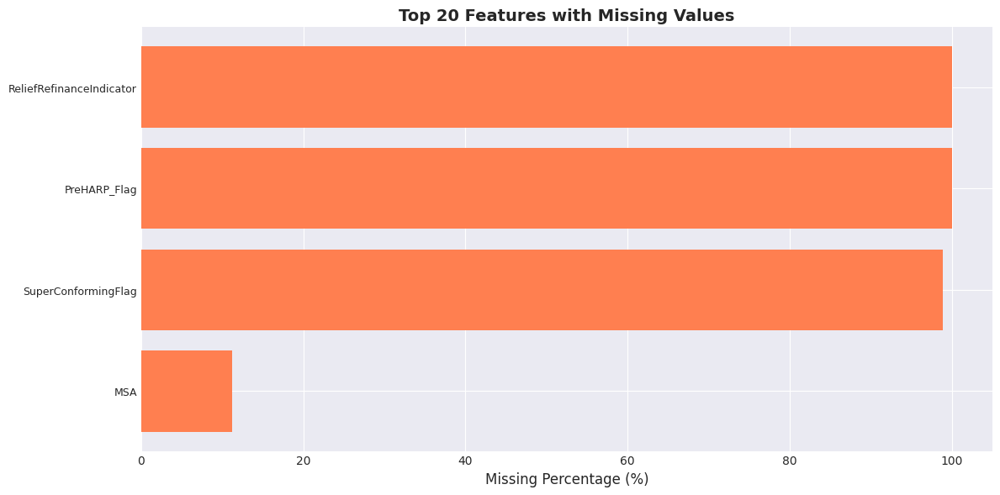

In [10]:
# Missing values in training set
missing_train = train_df.isnull().sum()
missing_train_pct = (missing_train / len(train_df)) * 100
missing_summary = pd.DataFrame({
    'Missing_Count': missing_train[missing_train > 0],
    'Missing_Percentage': missing_train_pct[missing_train > 0]
}).sort_values('Missing_Percentage', ascending=False)

print("TOP 20 FEATURES WITH MISSING VALUES:")
print(missing_summary.head(20))

# Visualize missing data pattern
plt.figure(figsize=(12, 6))
top_missing = missing_summary.head(20)
plt.barh(range(len(top_missing)), top_missing['Missing_Percentage'], color='coral')
plt.yticks(range(len(top_missing)), top_missing.index, fontsize=9)
plt.xlabel('Missing Percentage (%)', fontsize=12)
plt.title('Top 20 Features with Missing Values', fontsize=14, fontweight='bold')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

**General Observation**:

The training dataset contains 30,504 records with 144 features and 1 target variable, with **significant missing values** in certain features but no duplicate records found. Similarly, the validation dataset contains 5,370 records with 144 features and 1 target variable, also with **missing values** but no duplicate records found.

**Missing Values**:
- Several features have extremely high missing rates (>99%): ReliefRefinanceIndicator, PreHARP_Flag, and SuperConformingFlag
- These features are likely program-specific indicators that only apply to certain types of loans
- MSA (Metropolitan Statistical Area) has ~10% missing values, which is manageable
- **Strategy**: Features with >95% missing values should be dropped or handled carefully. For others, use imputation or create "missing" indicator features

**Target Variable**:
- As seen from the class distribution analysis, the **training dataset contains only normal loans (class "0")** - 100% of training samples
- The validation dataset exhibits class imbalance with **12.6% abnormal loans (class "1")** and **87.4% normal loans (class "0")**
- Since the training dataset contains only normal loans (class "0"), traditional supervised learning or oversampling techniques (SMOTE, ADASYN) cannot be applied
- This is a **unsupervised anomaly detection** problem that requires learning approaches such as:
  - Isolation Forest
  - One-Class SVM
  - Local Outlier Factor (LOF)
- The model must learn what "normal" loan behavior looks like from training data, then identify deviations as anomalies in validation/test data

#### Feature Categorization: Static vs Temporal

In [11]:
# Separate static and temporal features
static_features = []
temporal_features = []

for col in train_df.columns:
    if col not in ['index', 'target']:
        # Temporal features start with a digit (e.g., "0_CurrentActualUPB")
        if col[0].isdigit():
            temporal_features.append(col)
        else:
            static_features.append(col)

print(f"Number of STATIC features: {len(static_features)}")
print(f"Number of TEMPORAL features: {len(temporal_features)}")

# Extract time periods
temporal_months = sorted(list(set([int(col.split('_')[0]) for col in temporal_features])))
print(f"\nNumber of time periods: {len(temporal_months)}")

temporal_metrics = {}
for col in temporal_features:
    parts = col.split('_', 1)
    if len(parts) > 1:
        metric = parts[1]
        if metric not in temporal_metrics:
            temporal_metrics[metric] = []
        temporal_metrics[metric].append(col)

print(f"\nTemporal metrics tracked:")
for metric, cols in list(temporal_metrics.items())[:10]:
    print(f"  - {metric}: {len(cols)} time points")

Number of STATIC features: 31
Number of TEMPORAL features: 112

Number of time periods: 14

Temporal metrics tracked:
  - CurrentActualUPB: 14 time points
  - CurrentInterestRate: 14 time points
  - CurrentNonInterestBearingUPB: 14 time points
  - EstimatedLTV: 14 time points
  - InterestBearingUPB: 14 time points
  - LoanAge: 14 time points
  - MonthlyReportingPeriod: 14 time points
  - RemainingMonthsToLegalMaturity: 14 time points


#### Static Features Analysis

STATIC FEATURES STATISTICS (Training - Normal Loans Only)
             Feature          Mean     Median           Std     Min         Max
         CreditScore    751.130837    760.000     43.897118   600.0     830.000
        OriginalCLTV     75.425125     80.000     19.579456     6.0     105.000
         OriginalDTI     37.801593     40.000      9.317816     2.0      50.000
         OriginalUPB 317095.430108 277000.000 181297.522957 15000.0 1700000.000
         OriginalLTV     75.186205     80.000     19.433155     6.0      97.000
OriginalInterestRate      6.720708      6.625      0.551169     2.5       9.125
    OriginalLoanTerm    349.134409    360.000     42.439446    85.0     360.000


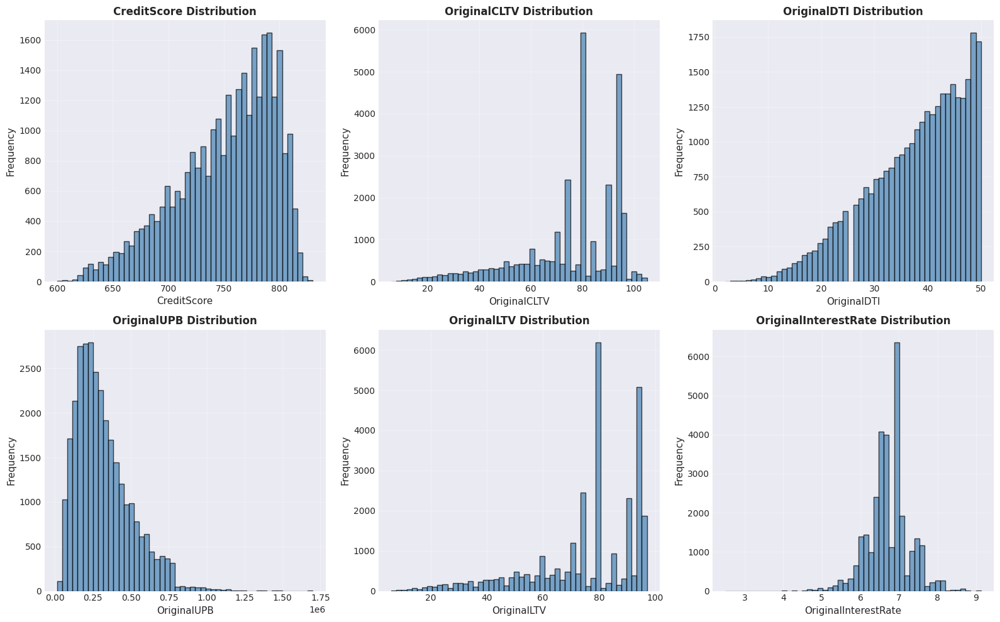

In [12]:
# Analyze key static features
key_static = ['CreditScore', 'OriginalCLTV', 'OriginalDTI', 'OriginalUPB', 
              'OriginalLTV', 'OriginalInterestRate', 'OriginalLoanTerm']

print("STATIC FEATURES STATISTICS (Training - Normal Loans Only)")
print("="*80)

stats_data = []
for feature in key_static:
    if feature in train_df.columns:
        # Filter out missing value indicators
        if feature == 'CreditScore':
            valid_values = train_df[train_df[feature] != 9999][feature]
        elif feature in ['OriginalDTI', 'OriginalLTV']:
            valid_values = train_df[train_df[feature] != 999][feature]
        else:
            valid_values = train_df[feature].dropna()
        
        stats_data.append({
            'Feature': feature,
            'Mean': valid_values.mean(),
            'Median': valid_values.median(),
            'Std': valid_values.std(),
            'Min': valid_values.min(),
            'Max': valid_values.max()
        })

stats_df = pd.DataFrame(stats_data)
print(stats_df.to_string(index=False))

# Visualize distributions
fig, axes = plt.subplots(2, 3, figsize=(16, 10))
axes = axes.ravel()

for idx, feature in enumerate(key_static[:6]):
    if feature in train_df.columns:
        if feature == 'CreditScore':
            data = train_df[train_df[feature] != 9999][feature]
        elif feature in ['OriginalDTI', 'OriginalLTV']:
            data = train_df[train_df[feature] != 999][feature]
        else:
            data = train_df[feature].dropna()
        
        axes[idx].hist(data, bins=50, color='steelblue', alpha=0.7, edgecolor='black')
        axes[idx].set_xlabel(feature, fontsize=11)
        axes[idx].set_ylabel('Frequency', fontsize=11)
        axes[idx].set_title(f'{feature} Distribution', fontsize=12, fontweight='bold')
        axes[idx].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

### Generate comprehensive profiling report

In [13]:
train_profile = ProfileReport(
    train_df, 
    title="Loan Training Data - Profiling Report",
    minimal=False,
    explorative=False,  
    interactions=None,  
)

display(train_profile)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 145/145 [00:02<00:00, 61.72it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

- We are working with loan performance data spanning 14 months from February 2024 through March 2025. 
- There are about 30,504 loans in the training set with 144 different variables, excluding the target, tracking everything from the original loan terms to monthly payment activity
- As observed above, the first thing that jumps out is the target variable being all zeros in training, which tells us this is really an unsupervised problem where we're hunting for anomalies rather than training on labeled defaults.
- The monthly time-series data shows the expected patterns. Unpaid principal balances tick down each month as borrowers make payments, loan ages increment by one each period, and months remaining to maturity counts down accordingly. These relationships are highly correlated across the 14 periods, which makes sense given they're tracking the same loans over time. What matters is when these patterns break down or behave weirdly.
- EstimatedLTV field looks questionable with averages in the 100s and 200s and maxing out at 999 in several periods. Based on dataset explaination, 999 represents unknown. 
- Handful of columns like PPM_Flag, InterestOnlyFlag, and ProductType never vary at all across the dataset, so they won't help distinguish anything. 
- Looking at the actual loan characteristics, mortgage insurance is zero for about 63% of loans. 
- By the final reporting period in March 2025, we see 251 loans that have been completely paid off (balance hits zero in the 13_CurrentActualUPB field). That's less than 1% of the portfolio but it's an interesting pattern. 
- Most loans are just chugging along with normal monthly principal reduction, but the ones deviating from that steady paydown behavior are what we need to flag.

##### 1. Indepth EDA: Loan payment ratio analysis

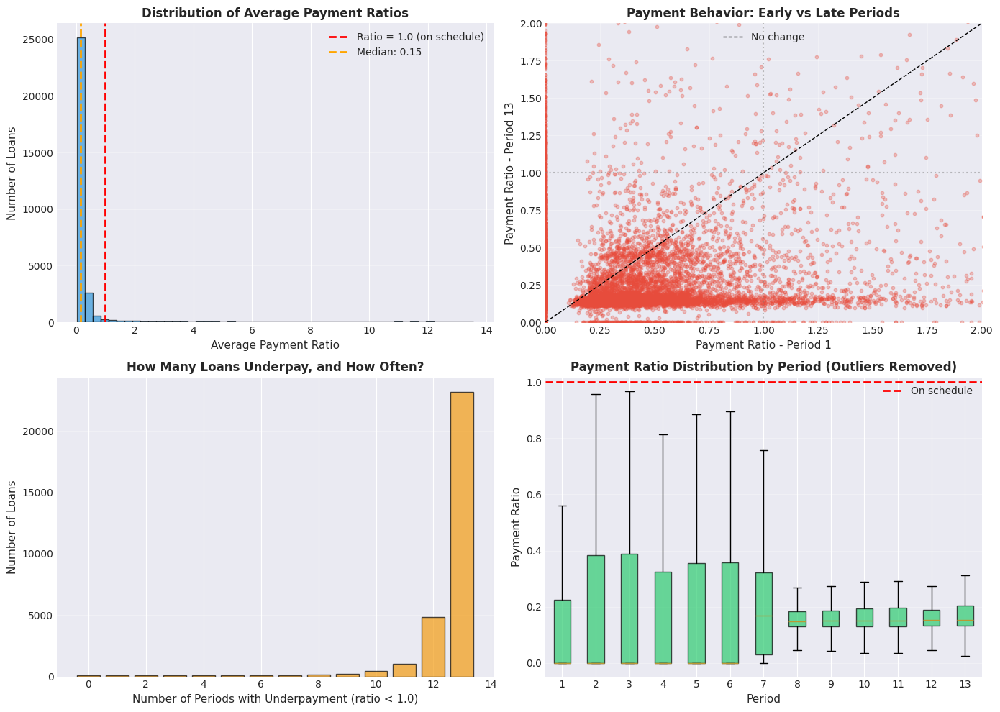

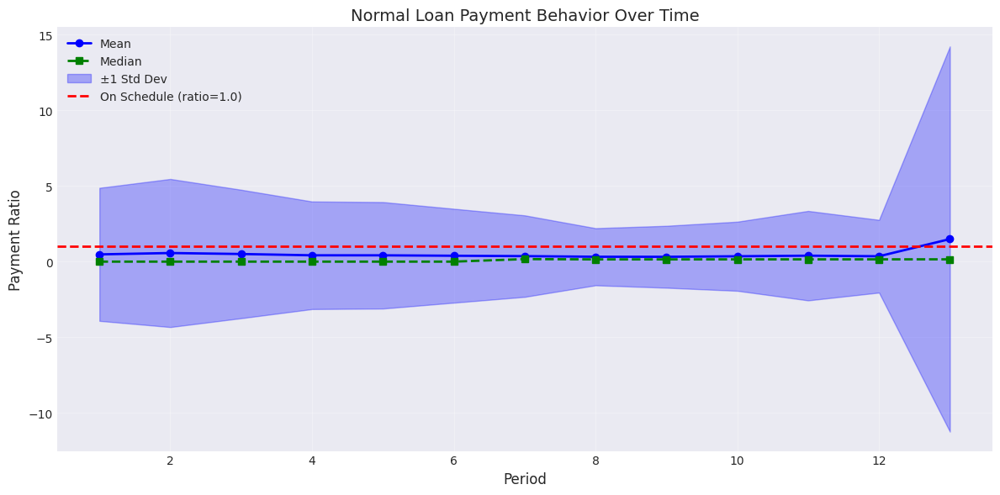

In [31]:
ratio_cols = [f'ratio_{i}' for i in range(1, 14)]

train_df['underpayment_count'] = (train_df[ratio_cols] < 1.0).sum(axis=1)
train_df['zero_payment_count'] = (train_df[ratio_cols] == 0).sum(axis=1)

early_avg = train_df[[f"ratio_{i}" for i in range(1, 7)]].mean(axis=1)
late_avg = train_df[[f"ratio_{i}" for i in range(7, 14)]].mean(axis=1)
train_df['payment_acceleration'] = late_avg - early_avg

fig, axes = plt.subplots(2, 2, figsize=(14, 10))

ax1 = axes[0, 0]
ax1.hist(train_df['avg_ratio'], bins=50, color='#3498db', edgecolor='black', alpha=0.7)
ax1.axvline(1.0, color='red', linestyle='--', linewidth=2, label='Ratio = 1.0 (on schedule)')
ax1.axvline(train_df['avg_ratio'].median(), color='orange', linestyle='--', linewidth=2, label=f"Median: {train_df['avg_ratio'].median():.2f}")
ax1.set_xlabel('Average Payment Ratio', fontsize=11)
ax1.set_ylabel('Number of Loans', fontsize=11)
ax1.set_title('Distribution of Average Payment Ratios', fontsize=12, fontweight='bold')
ax1.legend()
ax1.grid(True, alpha=0.3, axis='y')

ax2 = axes[0, 1]
ax2.scatter(train_df['ratio_1'], train_df['ratio_13'], alpha=0.3, s=10, color='#e74c3c')
ax2.plot([0, 2], [0, 2], 'k--', linewidth=1, label='No change')
ax2.axhline(1.0, color='gray', linestyle=':', alpha=0.5)
ax2.axvline(1.0, color='gray', linestyle=':', alpha=0.5)
ax2.set_xlabel('Payment Ratio - Period 1', fontsize=11)
ax2.set_ylabel('Payment Ratio - Period 13', fontsize=11)
ax2.set_title('Payment Behavior: Early vs Late Periods', fontsize=12, fontweight='bold')
ax2.set_xlim(0, 2)
ax2.set_ylim(0, 2)
ax2.legend()
ax2.grid(True, alpha=0.3)

ax3 = axes[1, 0]
underpay_counts = train_df['underpayment_count'].value_counts().sort_index()
ax3.bar(underpay_counts.index, underpay_counts.values, color='#f39c12', edgecolor='black', alpha=0.7)
ax3.set_xlabel('Number of Periods with Underpayment (ratio < 1.0)', fontsize=11)
ax3.set_ylabel('Number of Loans', fontsize=11)
ax3.set_title('How Many Loans Underpay, and How Often?', fontsize=12, fontweight='bold')
ax3.grid(True, alpha=0.3, axis='y')

ax4 = axes[1, 1]
ratio_data = [train_df[f'ratio_{i}'].clip(0, 2).values for i in range(1, 14)]
bp = ax4.boxplot(ratio_data, labels=range(1, 14), showfliers=False, patch_artist=True)
for patch in bp['boxes']:
    patch.set_facecolor('#2ecc71')
    patch.set_alpha(0.7)
ax4.axhline(1.0, color='red', linestyle='--', linewidth=2, label='On schedule')
ax4.set_xlabel('Period', fontsize=11)
ax4.set_ylabel('Payment Ratio', fontsize=11)
ax4.set_title('Payment Ratio Distribution by Period (Outliers Removed)', fontsize=12, fontweight='bold')
ax4.legend()
ax4.grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.show()


fig, ax = plt.subplots(figsize=(12, 6))

means = []
stds = []
medians = []
for period in range(1, 14):
    col = f"ratio_{period}"
    means.append(train_df[col].mean())
    stds.append(train_df[col].std())
    medians.append(train_df[col].median())

periods = list(range(1, 14))
means = np.array(means)
stds = np.array(stds)

ax.plot(periods, means, marker='o', label='Mean', color='blue', linewidth=2)
ax.plot(periods, medians, marker='s', label='Median', color='green', linewidth=2, linestyle='--')
ax.fill_between(periods, means - stds, means + stds, alpha=0.3, color='blue', label='±1 Std Dev')

ax.axhline(y=1.0, color='red', linestyle='--', linewidth=2, label='On Schedule (ratio=1.0)')
ax.set_xlabel('Period', fontsize=12)
ax.set_ylabel('Payment Ratio', fontsize=12)
ax.set_title('Normal Loan Payment Behavior Over Time', fontsize=14)
ax.legend()
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

Chart 1: Distribution of Average Payment Ratios (All Normal Loans)
- Shows: Massive spike at 0-0.5 range with median at 0.15. 
- Key insight: This IS what normal looks like for this portfolio. The training set contains only performing loans (target=0), and they cluster around 0.15 ratio.
- This low ratio is the baseline, not an anomaly. Loans modifications or forbearance may have reduced required payments significantly below original schedule.
- Unsup modeling: The model will learn this distribution as "normal." Anomalies in validation/test will be loans that fall outside this cluster - either extremely low (near 0), extremely high (>1.0), or have different distributional patterns.

Chart 2: Early Period (1) vs Late Period (13) Payment Ratios
- Shows: Dense cluster in bottom-left corner - most loans stay around 0.15 consistently
- Points along the diagonal = stable behavior over time (no change from early to late)
- Key insight: Normal loans maintain consistent payment patterns. They start low and stay low. - Points far from the diagonal indicate behavioral changes:
  - Below diagonal: deteriorating (paying less over time)
  - Above diagonal: improving (paying more over time)
  - Far from diagonal: large shifts that deviate from typical stable pattern

Chart 3: Frequency of Underpayment Periods
- Shows: Huge spike at 13 periods - most normal loans underpay in ALL 13 months
- Key insight: Consistent underpayment is NORMAL behavior in this portfolio.
- Nearly all performing loans underpaid throughout the observation period.

Chart 4: Payment Ratio Distribution by Period (Boxplot)
- Phase 1 (Feb-Jul '24): Higher, variable payments 
- Phase 2 (Sep '24-Mar '25): Lower, stable payments 
- Transition (Aug '24): Sharp systematic drop, suggests a systematic event affecting the entire portfolio


Chart 5: Normal Loan Payment Behavior Over time
- Normal loans are not paying on schedule
- Mean and median both hover around 0 across all periods - this means the "average" normal loan pays almost nothing relative to scheduled payment
- Massive variability (±1 std dev bands are huge) suggests extreme heterogeneity in normal loan behavior
- Period 13 explosion: Standard deviation spikes dramatically at the end, indicating some loans make large final payments while others don't
- Implication:  "normal" training set includes many loans that severely underpay. The dataset's definition of "normal" (target=0) is not the same as "paying on schedule"

##### 2. Indepth EDA: Payment Acceleration Distribution in Normal Loans

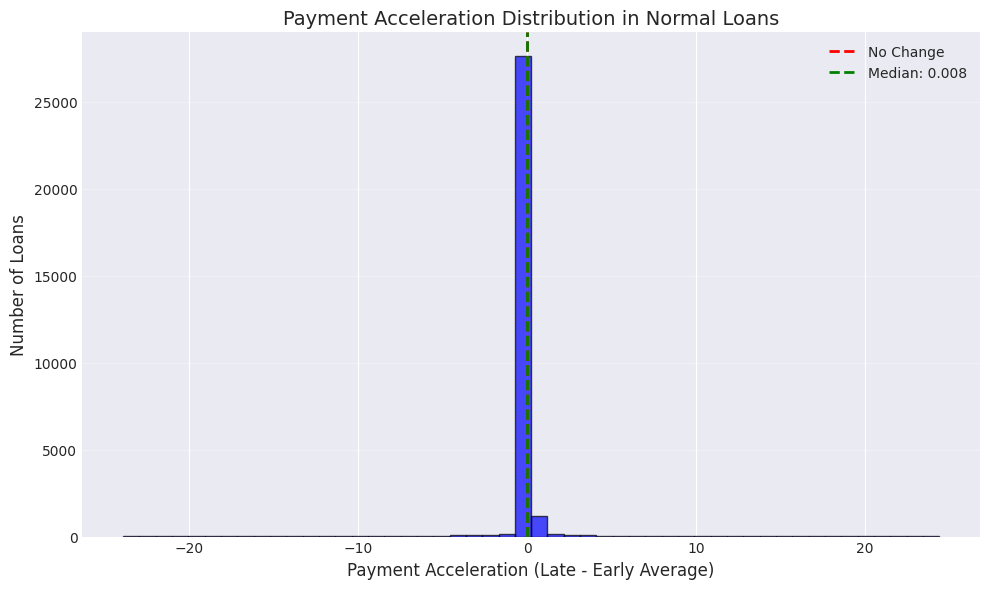

In [27]:
fig, ax = plt.subplots(figsize=(10, 6))
ax.hist(train_df['payment_acceleration'].dropna(), bins=50, color='blue', alpha=0.7, edgecolor='black')
ax.axvline(x=0, color='red', linestyle='--', linewidth=2, label='No Change')
median_accel = train_df['payment_acceleration'].median()
ax.axvline(x=median_accel, color='green', linestyle='--', linewidth=2, label=f"Median: {median_accel:.3f}")
ax.set_xlabel('Payment Acceleration (Late - Early Average)', fontsize=12)
ax.set_ylabel('Number of Loans', fontsize=12)
ax.set_title('Payment Acceleration Distribution in Normal Loans', fontsize=14)
ax.legend()
ax.grid(True, alpha=0.3, axis='y')
plt.tight_layout()
plt.show()

- Nearly all loans have acceleration ≈ 0 (median = 0.008, very close to zero)
- This means most normal loans maintain consistent payment patterns, they don't improve or worsen significantly over time
- Very few outliers with positive or negative acceleration
- This mean payment_acceleration has low discriminative power for anomalies if normal behavior is already "consistently poor".

##### 3. Indepth EDA: Normal Loan Balance Trajectory 

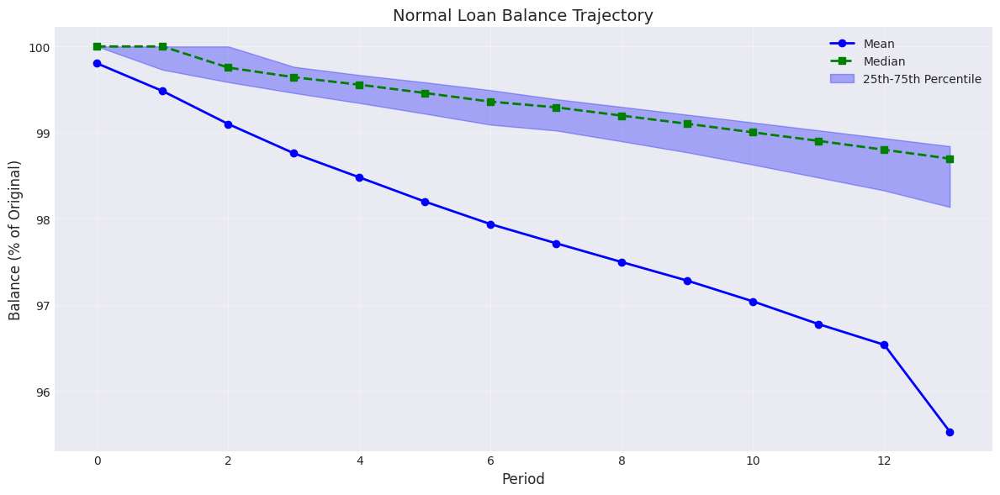

In [32]:
fig, ax = plt.subplots(figsize=(12, 6))
means = []
medians = []
q25 = []
q75 = []
for period in range(0, 14):
    col = f"{period}_CurrentActualUPB"
    pct_of_original = (train_df[col] / train_df['OriginalUPB'] * 100)
    means.append(pct_of_original.mean())
    medians.append(pct_of_original.median())
    q25.append(pct_of_original.quantile(0.25))
    q75.append(pct_of_original.quantile(0.75))

periods = list(range(0, 14))
ax.plot(periods, means, marker='o', label='Mean', color='blue', linewidth=2)
ax.plot(periods, medians, marker='s', label='Median', color='green', linewidth=2, linestyle='--')
ax.fill_between(periods, q25, q75, alpha=0.3, color='blue', label='25th-75th Percentile')
ax.set_xlabel('Period', fontsize=12)
ax.set_ylabel('Balance (% of Original)', fontsize=12)
ax.set_title('Normal Loan Balance Trajectory', fontsize=14)
ax.legend()
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

- Mean balance drops from 100% to only 95.5% over 13 months (~0.35% per month)
- Median is even higher at 98.7% - most loans barely pay down principal
- For a 30-year loan at 6.7% interest, scheduled payments should reduce balance by ~1.5-2% in 13 months
- This means loans are paying far less than scheduled, mostly covering interest with minimal principal reduction



##### 4. Indepth EDA: Advanced Payment Patterns - Statistical Analysis

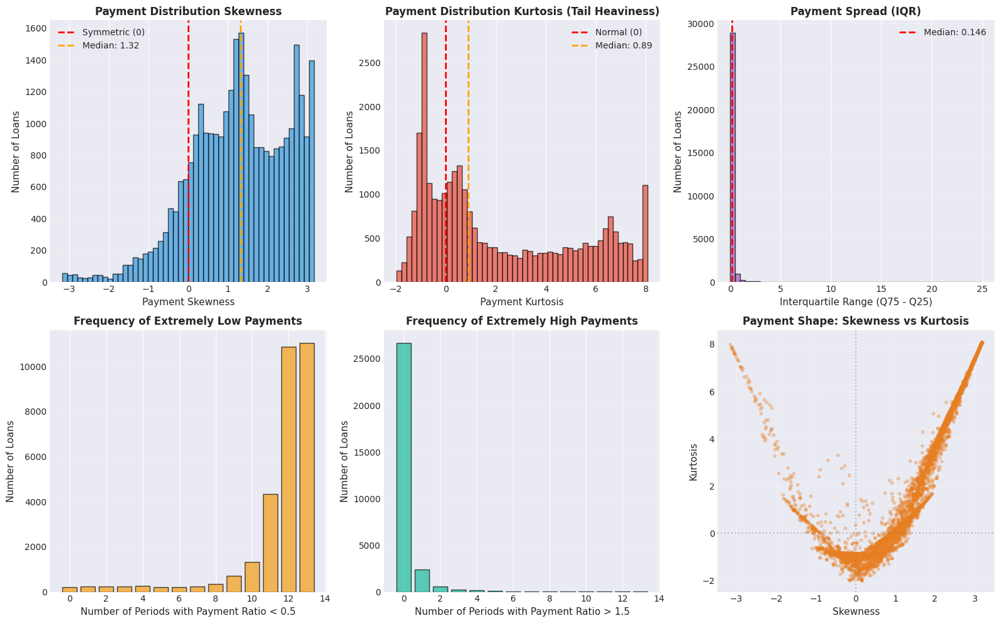


Advanced Pattern Statistics:
Loans with positive skew (right-tailed): 26168 (85.8%)
Loans with high kurtosis (heavy tails, >3): 10886 (35.7%)
Loans with extreme low payments (ratio < 0.5): 30303 (99.3%)
Loans with extreme high payments (ratio > 1.5): 3799 (12.5%)


In [6]:
def calculate_monthly_payment(principal, annual_rate, term_months):
    """Calculate scheduled monthly payment for a loan"""
    monthly_rate = annual_rate / 100 / 12
    if monthly_rate == 0:
        return principal / term_months
    return principal * monthly_rate * (1 + monthly_rate) ** term_months / ((1 + monthly_rate) ** term_months - 1)

payment_ratios = []
scheduled_payment = train_df.apply(
    lambda x: calculate_monthly_payment(
        x['OriginalUPB'], 
        x['OriginalInterestRate'], 
        x['OriginalLoanTerm']
    ), 
    axis=1
)

for period in range(1, 14):
    actual_payment = train_df[f"{period-1}_CurrentActualUPB"] - train_df[f"{period}_CurrentActualUPB"]
    actual_payment = actual_payment.clip(lower=0)
    ratio = actual_payment / scheduled_payment.replace(0, np.nan)
    payment_ratios.append(ratio)

payment_ratio_array = np.array(payment_ratios).T

# Calculate statistical moments
train_df['payment_skewness'] = stats.skew(payment_ratio_array, axis=1, nan_policy='omit')
train_df['payment_kurtosis'] = stats.kurtosis(payment_ratio_array, axis=1, nan_policy='omit')
train_df['payment_q25'] = np.percentile(payment_ratio_array, 25, axis=1)
train_df['payment_q75'] = np.percentile(payment_ratio_array, 75, axis=1)
train_df['payment_iqr'] = train_df['payment_q75'] - train_df['payment_q25']
train_df['extreme_low_payments'] = (payment_ratio_array < 0.5).sum(axis=1)
train_df['extreme_high_payments'] = (payment_ratio_array > 1.5).sum(axis=1)

fig, axes = plt.subplots(2, 3, figsize=(16, 10))

# Skewness Distribution
ax1 = axes[0, 0]
skew_clean = train_df['payment_skewness'].replace([np.inf, -np.inf], np.nan).dropna()
ax1.hist(skew_clean, bins=50, color='#3498db', edgecolor='black', alpha=0.7)
ax1.axvline(0, color='red', linestyle='--', linewidth=2, label='Symmetric (0)')
ax1.axvline(skew_clean.median(), color='orange', linestyle='--', linewidth=2, 
            label=f"Median: {skew_clean.median():.2f}")
ax1.set_xlabel('Payment Skewness', fontsize=11)
ax1.set_ylabel('Number of Loans', fontsize=11)
ax1.set_title('Payment Distribution Skewness', fontsize=12, fontweight='bold')
ax1.legend()
ax1.grid(True, alpha=0.3, axis='y')

# Kurtosis Distribution
ax2 = axes[0, 1]
kurt_clean = train_df['payment_kurtosis'].replace([np.inf, -np.inf], np.nan).dropna()
ax2.hist(kurt_clean, bins=50, color='#e74c3c', edgecolor='black', alpha=0.7)
ax2.axvline(0, color='red', linestyle='--', linewidth=2, label='Normal (0)')
ax2.axvline(kurt_clean.median(), color='orange', linestyle='--', linewidth=2, 
            label=f"Median: {kurt_clean.median():.2f}")
ax2.set_xlabel('Payment Kurtosis', fontsize=11)
ax2.set_ylabel('Number of Loans', fontsize=11)
ax2.set_title('Payment Distribution Kurtosis (Tail Heaviness)', fontsize=12, fontweight='bold')
ax2.legend()
ax2.grid(True, alpha=0.3, axis='y')

# Interquartile Range
ax3 = axes[0, 2]
ax3.hist(train_df['payment_iqr'], bins=50, color='#9b59b6', edgecolor='black', alpha=0.7)
ax3.axvline(train_df['payment_iqr'].median(), color='red', linestyle='--', linewidth=2, 
            label=f"Median: {train_df['payment_iqr'].median():.3f}")
ax3.set_xlabel('Interquartile Range (Q75 - Q25)', fontsize=11)
ax3.set_ylabel('Number of Loans', fontsize=11)
ax3.set_title('Payment Spread (IQR)', fontsize=12, fontweight='bold')
ax3.legend()
ax3.grid(True, alpha=0.3, axis='y')

# Extreme Low Payments
ax4 = axes[1, 0]
extreme_low_counts = train_df['extreme_low_payments'].value_counts().sort_index()
ax4.bar(extreme_low_counts.index, extreme_low_counts.values, color='#f39c12', edgecolor='black', alpha=0.7)
ax4.set_xlabel('Number of Periods with Payment Ratio < 0.5', fontsize=11)
ax4.set_ylabel('Number of Loans', fontsize=11)
ax4.set_title('Frequency of Extremely Low Payments', fontsize=12, fontweight='bold')
ax4.grid(True, alpha=0.3, axis='y')

# Extreme High Payments
ax5 = axes[1, 1]
extreme_high_counts = train_df['extreme_high_payments'].value_counts().sort_index()
ax5.bar(extreme_high_counts.index, extreme_high_counts.values, color='#1abc9c', edgecolor='black', alpha=0.7)
ax5.set_xlabel('Number of Periods with Payment Ratio > 1.5', fontsize=11)
ax5.set_ylabel('Number of Loans', fontsize=11)
ax5.set_title('Frequency of Extremely High Payments', fontsize=12, fontweight='bold')
ax5.grid(True, alpha=0.3, axis='y')

# Skewness vs Kurtosis Scatter
ax6 = axes[1, 2]
sample_idx = np.random.choice(len(train_df), size=min(5000, len(train_df)), replace=False)
scatter_data = train_df.iloc[sample_idx][['payment_skewness', 'payment_kurtosis']].replace([np.inf, -np.inf], np.nan).dropna()
ax6.scatter(scatter_data['payment_skewness'], scatter_data['payment_kurtosis'], 
            alpha=0.3, s=10, color='#e67e22')
ax6.axhline(0, color='gray', linestyle=':', alpha=0.5)
ax6.axvline(0, color='gray', linestyle=':', alpha=0.5)
ax6.set_xlabel('Skewness', fontsize=11)
ax6.set_ylabel('Kurtosis', fontsize=11)
ax6.set_title('Payment Shape: Skewness vs Kurtosis', fontsize=12, fontweight='bold')
ax6.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print("\nAdvanced Pattern Statistics:")
print(f"Loans with positive skew (right-tailed): {(train_df['payment_skewness'] > 0).sum()} "
      f"({(train_df['payment_skewness'] > 0).sum()/len(train_df)*100:.1f}%)")
print(f"Loans with high kurtosis (heavy tails, >3): {(train_df['payment_kurtosis'] > 3).sum()} "
      f"({(train_df['payment_kurtosis'] > 3).sum()/len(train_df)*100:.1f}%)")
print(f"Loans with extreme low payments (ratio < 0.5): {(train_df['extreme_low_payments'] > 0).sum()} "
      f"({(train_df['extreme_low_payments'] > 0).sum()/len(train_df)*100:.1f}%)")
print(f"Loans with extreme high payments (ratio > 1.5): {(train_df['extreme_high_payments'] > 0).sum()} "
      f"({(train_df['extreme_high_payments'] > 0).sum()/len(train_df)*100:.1f}%)")

1. Kurtosis (35.7% > 3, with ~1,100 loans at kurtosis ~8):
- Even within "normal" loans, there's a clear split shown by the bimodal distribution
- Those 1,100 loans at kurtosis ~8 are at the extreme edge of acceptable volatility while still performing

2. Extreme Payment Frequencies (99.3% have payments < 0.5):
- Nearly every normal loan underpays severely in 12-13 out of 13 months
- This challenge conventional thinking, and now means underpayment amount doesn't matter, payment pattern does

3. Skewness vs Kurtosis Scatter (V-shaped boundary):
- The V-shape literally maps what "normal" looks like in this portfolio
- Bottom-left = boring stable underpayers, upper-right = volatile but still performing
- Anomalies fall outside this V-pattern: below it (flatlined/abandoned) or above it (complete chaos)

##### 5. Indepth EDA: Balance Trajectory - Trend and Volatility Analysis

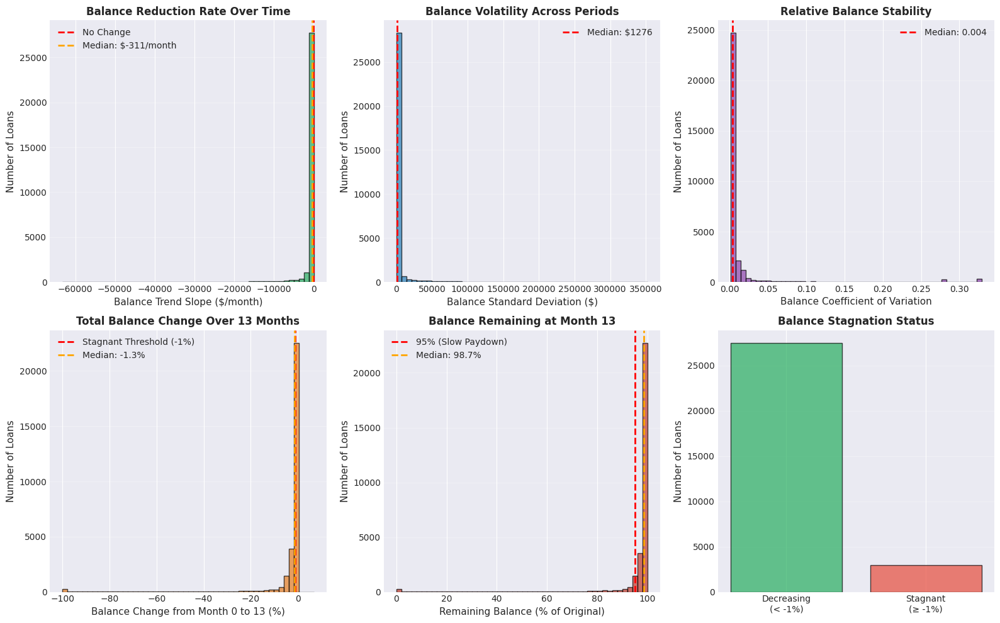


Balance Trajectory Statistics:
Median balance reduction rate: $-311.48 per month
Loans with negative slope (increasing balance): 11 (0.0%)
Loans with stagnant balance: 2990 (9.8%)
Median remaining balance: 98.7% of original


In [7]:
balances = []
for period in range(0, 14):
    balances.append(train_df[f"{period}_CurrentActualUPB"])
balance_array = np.array(balances).T

# Fit linear trend to balance over time
time_points = np.arange(14)
slopes = []
intercepts = []
for idx in range(len(train_df)):
    slope, intercept = np.polyfit(time_points, balance_array[idx], 1)
    slopes.append(slope)
    intercepts.append(intercept)

train_df['balance_trend_slope'] = slopes
train_df['balance_trend_intercept'] = intercepts
train_df['balance_std'] = np.std(balance_array, axis=1)
train_df['balance_cv'] = train_df['balance_std'] / np.mean(balance_array, axis=1)
train_df['balance_pct_change'] = (train_df['13_CurrentActualUPB'] - train_df['0_CurrentActualUPB']) / train_df['0_CurrentActualUPB'].replace(0, np.nan)
train_df['balance_stagnant'] = (train_df['balance_pct_change'] > -0.01).astype(int)
train_df['remaining_balance_ratio'] = train_df['13_CurrentActualUPB'] / train_df['OriginalUPB']

fig, axes = plt.subplots(2, 3, figsize=(16, 10))

# Balance Trend Slope
ax1 = axes[0, 0]
ax1.hist(train_df['balance_trend_slope'], bins=50, color='#27ae60', edgecolor='black', alpha=0.7)
ax1.axvline(0, color='red', linestyle='--', linewidth=2, label='No Change')
ax1.axvline(train_df['balance_trend_slope'].median(), color='orange', linestyle='--', 
            linewidth=2, label=f"Median: ${train_df['balance_trend_slope'].median():.0f}/month")
ax1.set_xlabel('Balance Trend Slope ($/month)', fontsize=11)
ax1.set_ylabel('Number of Loans', fontsize=11)
ax1.set_title('Balance Reduction Rate Over Time', fontsize=12, fontweight='bold')
ax1.legend()
ax1.grid(True, alpha=0.3, axis='y')

# Balance Volatility
ax2 = axes[0, 1]
ax2.hist(train_df['balance_std'], bins=50, color='#2980b9', edgecolor='black', alpha=0.7)
ax2.axvline(train_df['balance_std'].median(), color='red', linestyle='--', 
            linewidth=2, label=f"Median: ${train_df['balance_std'].median():.0f}")
ax2.set_xlabel('Balance Standard Deviation ($)', fontsize=11)
ax2.set_ylabel('Number of Loans', fontsize=11)
ax2.set_title('Balance Volatility Across Periods', fontsize=12, fontweight='bold')
ax2.legend()
ax2.grid(True, alpha=0.3, axis='y')

# Coefficient of Variation
ax3 = axes[0, 2]
cv_clean = train_df['balance_cv'].replace([np.inf, -np.inf], np.nan).dropna()
cv_clipped = cv_clean.clip(upper=cv_clean.quantile(0.99))
ax3.hist(cv_clipped, bins=50, color='#8e44ad', edgecolor='black', alpha=0.7)
ax3.axvline(cv_clipped.median(), color='red', linestyle='--', 
            linewidth=2, label=f"Median: {cv_clipped.median():.3f}")
ax3.set_xlabel('Balance Coefficient of Variation', fontsize=11)
ax3.set_ylabel('Number of Loans', fontsize=11)
ax3.set_title('Relative Balance Stability', fontsize=12, fontweight='bold')
ax3.legend()
ax3.grid(True, alpha=0.3, axis='y')

# Balance Percent Change
ax4 = axes[1, 0]
pct_change_clean = train_df['balance_pct_change'].replace([np.inf, -np.inf], np.nan).dropna()
ax4.hist(pct_change_clean * 100, bins=50, color='#e67e22', edgecolor='black', alpha=0.7)
ax4.axvline(-1, color='red', linestyle='--', linewidth=2, label='Stagnant Threshold (-1%)')
ax4.axvline(pct_change_clean.median() * 100, color='orange', linestyle='--', 
            linewidth=2, label=f"Median: {pct_change_clean.median()*100:.1f}%")
ax4.set_xlabel('Balance Change from Month 0 to 13 (%)', fontsize=11)
ax4.set_ylabel('Number of Loans', fontsize=11)
ax4.set_title('Total Balance Change Over 13 Months', fontsize=12, fontweight='bold')
ax4.legend()
ax4.grid(True, alpha=0.3, axis='y')

# Remaining Balance Ratio
ax5 = axes[1, 1]
ax5.hist(train_df['remaining_balance_ratio'] * 100, bins=50, color='#c0392b', edgecolor='black', alpha=0.7)
ax5.axvline(95, color='red', linestyle='--', linewidth=2, label='95% (Slow Paydown)')
ax5.axvline(train_df['remaining_balance_ratio'].median() * 100, color='orange', linestyle='--', 
            linewidth=2, label=f"Median: {train_df['remaining_balance_ratio'].median()*100:.1f}%")
ax5.set_xlabel('Remaining Balance (% of Original)', fontsize=11)
ax5.set_ylabel('Number of Loans', fontsize=11)
ax5.set_title('Balance Remaining at Month 13', fontsize=12, fontweight='bold')
ax5.legend()
ax5.grid(True, alpha=0.3, axis='y')

# Stagnant Balance Distribution
ax6 = axes[1, 2]
stagnant_counts = train_df['balance_stagnant'].value_counts()
labels = ['Decreasing\n(< -1%)', 'Stagnant\n(≥ -1%)']
colors = ['#27ae60', '#e74c3c']
ax6.bar(labels, [stagnant_counts.get(0, 0), stagnant_counts.get(1, 0)], 
        color=colors, edgecolor='black', alpha=0.7)
ax6.set_ylabel('Number of Loans', fontsize=11)
ax6.set_title('Balance Stagnation Status', fontsize=12, fontweight='bold')
ax6.grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.show()

print("\nBalance Trajectory Statistics:")
print(f"Median balance reduction rate: ${train_df['balance_trend_slope'].median():.2f} per month")
print(f"Loans with negative slope (increasing balance): {(train_df['balance_trend_slope'] > 0).sum()} "
      f"({(train_df['balance_trend_slope'] > 0).sum()/len(train_df)*100:.1f}%)")
print(f"Loans with stagnant balance: {train_df['balance_stagnant'].sum()} "
      f"({train_df['balance_stagnant'].sum()/len(train_df)*100:.1f}%)")
print(f"Median remaining balance: {train_df['remaining_balance_ratio'].median()*100:.1f}% of original")

1. Balance Reduction Rate (Median = -$311/month):
- Normal loans pay down only $311/month on $300k+ mortgages - way below expected from standard amortization
- The distribution is extremely narrow, almost everyone follows this exact same slow paydown pattern

2. Coefficient of Variation (Median = 0.004):
- CV of 0.004 means balances vary by less than 0.5% across 13 months 
- This isn't normal mortgage behavior, it's systematic modification or forbearance behavior

3. Total Balance Change (Median = -1.3% over 13 months):
- Normal loans only reduce 1.3% of principal in a full year
- The tight clustering means everyone's in the same boat 

4. Balance Stagnation (9% at ≥-1% change):
- 2,990 loans are borderline stagnant but still labeled normalm probably the riskiest subset of "normal" loans

##### 6. Indepth EDA: Credit Risk Indicators (Combined with Payment Behavior)

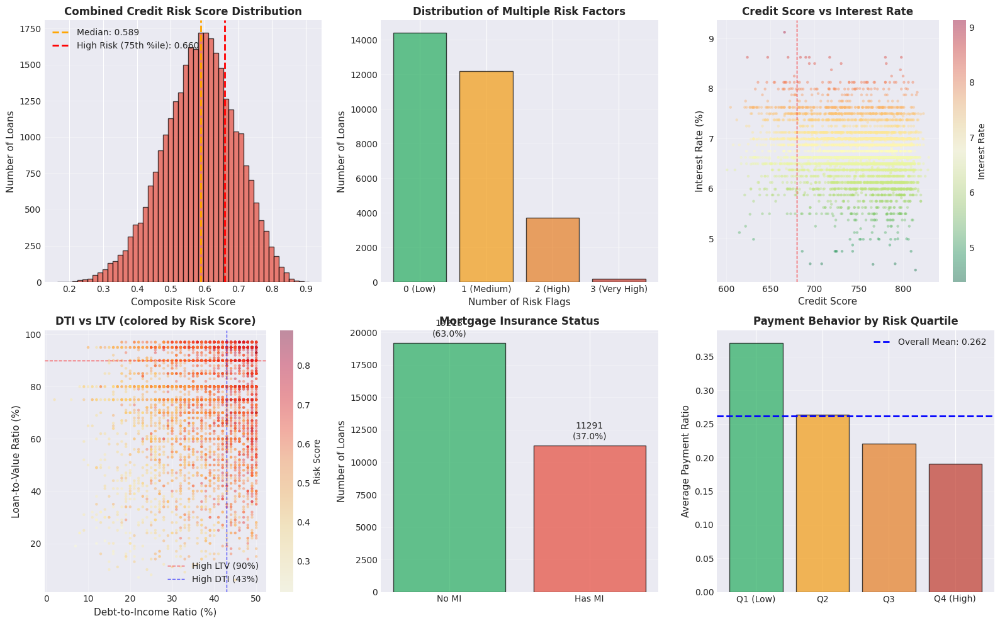


Credit Risk Statistics:
Loans with 0 risk flags: 14405 (47.2%)
Loans with 1+ risk flags: 16099 (52.8%)
Loans with 2+ risk flags: 3918 (12.8%)
Loans with 3 risk flags: 197 (0.6%)

Median composite risk score: 0.589
High risk loans (top 25%): 7626


In [9]:
# Calculate payment ratios first (needed for later EDA sections)
ratio_cols = []
scheduled_payment = train_df.apply(
    lambda x: calculate_monthly_payment(
        x['OriginalUPB'], 
        x['OriginalInterestRate'], 
        x['OriginalLoanTerm']
    ), 
    axis=1
)

for period in range(1, 14):
    current_upb_col = f"{period}_CurrentActualUPB"
    prev_upb_col = f"{period-1}_CurrentActualUPB"
    
    actual_payment = train_df[prev_upb_col] - train_df[current_upb_col]
    actual_payment = actual_payment.clip(lower=0)
    
    ratio = actual_payment / scheduled_payment.replace(0, np.nan)
    upper_bound = ratio.quantile(0.99)
    ratio = ratio.clip(upper=upper_bound)
    train_df[f"ratio_{period}"] = ratio

ratio_cols = [f'ratio_{i}' for i in range(1, 14)]
train_df['avg_ratio'] = train_df[ratio_cols].mean(axis=1)

train_df['credit_score_clean'] = train_df['CreditScore'].replace(9999, np.nan)
train_df['dti_clean'] = train_df['OriginalDTI'].replace(999, np.nan)
train_df['ltv_clean'] = train_df['OriginalLTV'].replace(999, np.nan)
train_df['cltv_clean'] = train_df['OriginalCLTV'].replace(999, np.nan)

# Calculate composite risk score
train_df['composite_risk_score'] = (
    (800 - train_df['credit_score_clean'].fillna(750)) / 200 * 0.3 +
    train_df['dti_clean'].fillna(37) / 50 * 0.3 +
    train_df['ltv_clean'].fillna(75) / 100 * 0.2 +
    train_df['OriginalInterestRate'] / 10 * 0.2
)

# Risk flags
train_df['high_dti_flag'] = (train_df['dti_clean'] > 43).astype(int)
train_df['high_ltv_flag'] = (train_df['ltv_clean'] > 90).astype(int)
train_df['low_credit_flag'] = (train_df['credit_score_clean'] < 680).astype(int)
train_df['has_mi_flag'] = (train_df['MI_Pct'] > 0).astype(int)

# Combined risk categories
train_df['total_risk_flags'] = (train_df['high_dti_flag'] + train_df['high_ltv_flag'] + 
                                 train_df['low_credit_flag'])

fig, axes = plt.subplots(2, 3, figsize=(16, 10))

# Composite Risk Score
ax1 = axes[0, 0]
ax1.hist(train_df['composite_risk_score'], bins=50, color='#e74c3c', edgecolor='black', alpha=0.7)
ax1.axvline(train_df['composite_risk_score'].median(), color='orange', linestyle='--', 
            linewidth=2, label=f"Median: {train_df['composite_risk_score'].median():.3f}")
high_risk_threshold = train_df['composite_risk_score'].quantile(0.75)
ax1.axvline(high_risk_threshold, color='red', linestyle='--', linewidth=2, 
            label=f"High Risk (75th %ile): {high_risk_threshold:.3f}")
ax1.set_xlabel('Composite Risk Score', fontsize=11)
ax1.set_ylabel('Number of Loans', fontsize=11)
ax1.set_title('Combined Credit Risk Score Distribution', fontsize=12, fontweight='bold')
ax1.legend()
ax1.grid(True, alpha=0.3, axis='y')

# Risk Flag Combinations
ax2 = axes[0, 1]
risk_flag_counts = train_df['total_risk_flags'].value_counts().sort_index()
colors_risk = ['#27ae60', '#f39c12', '#e67e22', '#c0392b']
ax2.bar(risk_flag_counts.index, risk_flag_counts.values, 
        color=[colors_risk[i] for i in risk_flag_counts.index], edgecolor='black', alpha=0.7)
ax2.set_xlabel('Number of Risk Flags', fontsize=11)
ax2.set_ylabel('Number of Loans', fontsize=11)
ax2.set_title('Distribution of Multiple Risk Factors', fontsize=12, fontweight='bold')
ax2.set_xticks(range(4))
ax2.set_xticklabels(['0 (Low)', '1 (Medium)', '2 (High)', '3 (Very High)'])
ax2.grid(True, alpha=0.3, axis='y')

# Credit Score vs Interest Rate
ax3 = axes[0, 2]
sample_idx = np.random.choice(len(train_df), size=min(5000, len(train_df)), replace=False)
scatter_data = train_df.iloc[sample_idx][['credit_score_clean', 'OriginalInterestRate']].dropna()
scatter = ax3.scatter(scatter_data['credit_score_clean'], scatter_data['OriginalInterestRate'], 
                      c=scatter_data['OriginalInterestRate'], cmap='RdYlGn_r', 
                      alpha=0.4, s=10, edgecolors='none')
ax3.axvline(680, color='red', linestyle='--', linewidth=1, alpha=0.7)
ax3.set_xlabel('Credit Score', fontsize=11)
ax3.set_ylabel('Interest Rate (%)', fontsize=11)
ax3.set_title('Credit Score vs Interest Rate', fontsize=12, fontweight='bold')
plt.colorbar(scatter, ax=ax3, label='Interest Rate')
ax3.grid(True, alpha=0.3)

# DTI vs LTV Scatter
ax4 = axes[1, 0]
scatter_data2 = train_df.iloc[sample_idx][['dti_clean', 'ltv_clean', 'composite_risk_score']].dropna()
scatter2 = ax4.scatter(scatter_data2['dti_clean'], scatter_data2['ltv_clean'], 
                       c=scatter_data2['composite_risk_score'], cmap='YlOrRd', 
                       alpha=0.4, s=10, edgecolors='none')
ax4.axhline(90, color='red', linestyle='--', linewidth=1, alpha=0.7, label='High LTV (90%)')
ax4.axvline(43, color='blue', linestyle='--', linewidth=1, alpha=0.7, label='High DTI (43%)')
ax4.set_xlabel('Debt-to-Income Ratio (%)', fontsize=11)
ax4.set_ylabel('Loan-to-Value Ratio (%)', fontsize=11)
ax4.set_title('DTI vs LTV (colored by Risk Score)', fontsize=12, fontweight='bold')
plt.colorbar(scatter2, ax=ax4, label='Risk Score')
ax4.legend(loc='lower right')
ax4.grid(True, alpha=0.3)

# Mortgage Insurance Distribution
ax5 = axes[1, 1]
mi_categories = []
for val in train_df['MI_Pct']:
    if val == 0:
        mi_categories.append('No MI')
    elif val == 999:
        mi_categories.append('Unknown')
    else:
        mi_categories.append('Has MI')
mi_dist = pd.Series(mi_categories).value_counts()
colors_mi = ['#27ae60', '#e74c3c', '#95a5a6']
ax5.bar(mi_dist.index, mi_dist.values, color=colors_mi, edgecolor='black', alpha=0.7)
for i, v in enumerate(mi_dist.values):
    ax5.text(i, v + 500, f"{v}\n({v/len(train_df)*100:.1f}%)", ha='center', fontsize=10)
ax5.set_ylabel('Number of Loans', fontsize=11)
ax5.set_title('Mortgage Insurance Status', fontsize=12, fontweight='bold')
ax5.grid(True, alpha=0.3, axis='y')

# Risk Score by Payment Behavior
ax6 = axes[1, 2]
risk_quartiles = pd.qcut(train_df['composite_risk_score'], q=4, labels=['Q1 (Low)', 'Q2', 'Q3', 'Q4 (High)'])
payment_by_risk = train_df.groupby(risk_quartiles)['avg_ratio'].mean()
colors_q = ['#27ae60', '#f39c12', '#e67e22', '#c0392b']
bars = ax6.bar(range(len(payment_by_risk)), payment_by_risk.values, 
               color=colors_q, edgecolor='black', alpha=0.7)
ax6.set_xticks(range(len(payment_by_risk)))
ax6.set_xticklabels(payment_by_risk.index, rotation=0)
ax6.set_ylabel('Average Payment Ratio', fontsize=11)
ax6.set_title('Payment Behavior by Risk Quartile', fontsize=12, fontweight='bold')
ax6.axhline(train_df['avg_ratio'].mean(), color='blue', linestyle='--', 
            linewidth=2, label=f"Overall Mean: {train_df['avg_ratio'].mean():.3f}")
ax6.legend()
ax6.grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.show()

print("\nCredit Risk Statistics:")
print(f"Loans with 0 risk flags: {(train_df['total_risk_flags'] == 0).sum()} "
      f"({(train_df['total_risk_flags'] == 0).sum()/len(train_df)*100:.1f}%)")
print(f"Loans with 1+ risk flags: {(train_df['total_risk_flags'] >= 1).sum()} "
      f"({(train_df['total_risk_flags'] >= 1).sum()/len(train_df)*100:.1f}%)")
print(f"Loans with 2+ risk flags: {(train_df['total_risk_flags'] >= 2).sum()} "
      f"({(train_df['total_risk_flags'] >= 2).sum()/len(train_df)*100:.1f}%)")
print(f"Loans with 3 risk flags: {(train_df['total_risk_flags'] == 3).sum()} "
      f"({(train_df['total_risk_flags'] == 3).sum()/len(train_df)*100:.1f}%)")
print(f"\nMedian composite risk score: {train_df['composite_risk_score'].median():.3f}")
print(f"High risk loans (top 25%): {(train_df['composite_risk_score'] > train_df['composite_risk_score'].quantile(0.75)).sum()}")

1. Distribution of Multiple Risk Factors (52.8% have 1+ flags):
- Portfolio is split roughly 50-50 between "clean" loans and those with risk factors
- Yet both groups are in the training set as normal - having high DTI, high LTV, or low credit score doesn't automatically mean trouble
- Only 197 loans (0.6%) have all 3 risk flags, but they're still performing
- Suggests static origination risk might not be predictive on its own

2. DTI vs LTV Scatter (colored by Risk Score):
- Clear clustering below the high-risk thresholds (DTI<43%, LTV<90%)
- But there's a dense cloud in the upper-right quadrant (high DTI + high LTV) that's still labeled normal
- Traditional underwriting would flag these as risky, yet they're performing fine
- This mean static metrics alone probably won't separate anomalies, we need to combine with behavioral patterns

3. Mortgage Insurance (37% have MI):
- Over 11,000 loans carry mortgage insurance, typically required for risky originations
- MI presence just reflects origination decisions, not ongoing performance
- Unlikely to be predictive by itself

4. Payment Behavior by Risk Quartile:
- All quartiles pay roughly the same (~0.19-0.36 ratio), with Q1 (lowest risk) actually paying slightly more
- Q4 (highest risk by traditional metrics) pays only marginally less


##### Summary of EDA findings

1. Target Variable & Problem Nature:
- Training set contains 100% normal loans (target=0) - pure unsupervised anomaly detection problem
- Validation set has 12.6% anomalies, 87.4% normal - severe class imbalance
- Cannot use supervised methods or oversampling (SMOTE/ADASYN)

2. Payment Behavior Patterns:
- Normal loans pay only ~15-36% of scheduled payments (median ratio = 0.15)
- 99.3% of normal loans have extreme underpayments (ratio < 0.5) in most periods
- Consistent underpayment is the normal baseline, not an anomaly signal
- Balance reduces only 1.3% over 13 months vs expected 1.5-2%
- Payment patterns more important than payment amounts

3. Temporal Dynamics:
- Systematic drop in August 2024 affects entire portfolio (potential modification/forbearance event)
- Mean payment ratio hovers near 0 across all periods with massive variability
- 9.8% of loans are stagnant (balance barely decreasing)
- Median balance reduction: only $311/month

4. Statistical Payment Characteristics:
- 85.8% of loans show positive skewness (right-tailed payment distribution)
- 35.7% have high kurtosis (>3), indicating volatile but still performing loans
- V-shaped pattern in skewness vs kurtosis scatter defines "normal" boundary
- Coefficient of variation = 0.004 (extremely consistent slow paydown)

5. Credit Risk Indicators:
- 52.8% of normal loans have 1+ traditional risk flags (high DTI/LTV, low credit)
- Static origination metrics (credit score, DTI, LTV) do not differentiate normal from anomaly
- All risk quartiles pay similarly (~0.19-0.36 ratio)

6. Key Implication for Modeling:
- Anomalies are not loans that underpay, that's normal behavior
- Anomalies are loans with different pattern: payment volatility changes, trajectory deviations, behavioral inconsistencies
- Must focus on relative patterns, trends, and changes rather than absolute payment levels

### Feature Engineering Strategy

In [20]:
import pandas as pd
import numpy as np
from scipy import stats
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler

def create_baseline_payment_features(df):
    features = pd.DataFrame(index=df.index)
    
    for period in range(1, 14):
        actual_payment = df[f"{period-1}_CurrentActualUPB"] - df[f"{period}_CurrentActualUPB"]
        actual_payment = actual_payment.clip(lower=0)
        
        scheduled_payment = df.apply(
            lambda x: calculate_monthly_payment(x['OriginalUPB'], x['OriginalInterestRate'], x['OriginalLoanTerm']), 
            axis=1
        )
        
        ratio = actual_payment / scheduled_payment.replace(0, np.nan)
        upper_bound = ratio.quantile(0.99)
        ratio = ratio.clip(upper=upper_bound)
        features[f"payment_ratio_{period}"] = ratio
    
    for i in range(3, 14):
        features[f"ratio_mean_win3_{i}"] = features[[f"payment_ratio_{i-2}", f"payment_ratio_{i-1}", f"payment_ratio_{i}"]].mean(axis=1)
        features[f"ratio_std_win3_{i}"] = features[[f"payment_ratio_{i-2}", f"payment_ratio_{i-1}", f"payment_ratio_{i}"]].std(axis=1)
        features[f"ratio_trend_win3_{i}"] = (features[f"payment_ratio_{i}"] - features[f"payment_ratio_{i-2}"]) / 2
    
    ratio_cols = [col for col in features.columns if col.startswith('payment_ratio_')]
    features['avg_payment_ratio'] = features[ratio_cols].mean(axis=1)
    features['std_payment_ratio'] = features[ratio_cols].std(axis=1)
    features['min_payment_ratio'] = features[ratio_cols].min(axis=1)
    features['max_payment_ratio'] = features[ratio_cols].max(axis=1)
    features['recent3_avg_ratio'] = features[[f"payment_ratio_{i}" for i in range(11, 14)]].mean(axis=1)
    features['recent5_avg_ratio'] = features[[f"payment_ratio_{i}" for i in range(9, 14)]].mean(axis=1)
    
    for i in range(2, 14):
        features[f"ratio_diff_{i}"] = features[f"payment_ratio_{i}"] - features[f"payment_ratio_{i-1}"]
    
    features['under_payment_count'] = (features[ratio_cols] < 1.0).sum(axis=1)
    features['zero_payment_count'] = (features[ratio_cols] == 0).sum(axis=1)
    features['paid_off_flag'] = (df['13_CurrentActualUPB'] == 0).astype(int)
    
    early_avg = features[[f"payment_ratio_{i}" for i in range(1, 7)]].mean(axis=1)
    late_avg = features[[f"payment_ratio_{i}" for i in range(7, 14)]].mean(axis=1)
    features['payment_acceleration'] = late_avg - early_avg
    
    return features

def create_payment_velocity_features(df):
    features = pd.DataFrame(index=df.index)
    
    for period in range(1, 14):
        reduction = df[f"{period-1}_CurrentActualUPB"] - df[f"{period}_CurrentActualUPB"]
        features[f"principal_reduction_{period}"] = reduction
    
    reduction_cols = [col for col in features.columns if col.startswith('principal_reduction_')]
    features['avg_principal_reduction'] = features[reduction_cols].mean(axis=1)
    features['total_principal_reduced'] = features[reduction_cols].sum(axis=1)
    features['std_principal_reduction'] = features[reduction_cols].std(axis=1)
    
    early_reduction = features[[f"principal_reduction_{i}" for i in range(1, 7)]].mean(axis=1)
    late_reduction = features[[f"principal_reduction_{i}" for i in range(7, 14)]].mean(axis=1)
    features['payment_acceleration'] = late_reduction - early_reduction
    
    expected_reduction = df['OriginalUPB'] - df['13_CurrentActualUPB']
    features['expected_vs_actual_reduction'] = features['total_principal_reduced'] / expected_reduction.replace(0, np.nan)
    
    return features

def create_payment_irregularity_features(df):
    features = pd.DataFrame(index=df.index)
    
    scheduled_payment = df.apply(
        lambda x: calculate_monthly_payment(x['OriginalUPB'], x['OriginalInterestRate'], x['OriginalLoanTerm']), 
        axis=1
    )
    
    for period in range(1, 14):
        actual_payment = df[f"{period-1}_CurrentActualUPB"] - df[f"{period}_CurrentActualUPB"]
        actual_payment = actual_payment.clip(lower=0)
        ratio = actual_payment / scheduled_payment.replace(0, np.nan)
        features[f"underpayment_{period}"] = (ratio < 0.9).astype(int)
        features[f"zero_payment_{period}"] = (actual_payment == 0).astype(int)
    
    underpayment_cols = [col for col in features.columns if col.startswith('underpayment_')]
    zero_cols = [col for col in features.columns if col.startswith('zero_payment_')]
    
    features['total_underpayments'] = features[underpayment_cols].sum(axis=1)
    features['total_zero_payments'] = features[zero_cols].sum(axis=1)
    features['recent_underpayments'] = features[[f"underpayment_{i}" for i in range(11, 14)]].sum(axis=1)
    features['recent_zero_payments'] = features[[f"zero_payment_{i}" for i in range(11, 14)]].sum(axis=1)
    
    for idx in df.index:
        max_streak = 0
        current_streak = 0
        for col in underpayment_cols:
            if features.loc[idx, col] == 1:
                current_streak += 1
                max_streak = max(max_streak, current_streak)
            else:
                current_streak = 0
        features.loc[idx, 'max_underpayment_streak'] = max_streak
    
    return features

def create_balance_trajectory_features(df):
    features = pd.DataFrame(index=df.index)
    
    balances = []
    for period in range(0, 14):
        balances.append(df[f"{period}_CurrentActualUPB"])
    balance_array = np.array(balances).T
    
    time_points = np.arange(14)
    for idx in range(len(df)):
        slope, intercept = np.polyfit(time_points, balance_array[idx], 1)
        features.loc[df.index[idx], 'balance_trend_slope'] = slope
        features.loc[df.index[idx], 'balance_trend_intercept'] = intercept
    
    features['balance_std'] = np.std(balance_array, axis=1)
    features['balance_cv'] = features['balance_std'] / np.mean(balance_array, axis=1)
    features['balance_pct_change'] = (df['13_CurrentActualUPB'] - df['0_CurrentActualUPB']) / df['0_CurrentActualUPB'].replace(0, np.nan)
    features['balance_stagnant'] = (features['balance_pct_change'] > -0.01).astype(int)
    features['remaining_balance_ratio'] = df['13_CurrentActualUPB'] / df['OriginalUPB']
    
    return features

def create_credit_risk_features(df):
    features = pd.DataFrame(index=df.index)
    
    features['credit_score'] = df['CreditScore']
    features['dti_ratio'] = df['OriginalDTI']
    features['ltv_ratio'] = df['OriginalLTV']
    features['cltv_ratio'] = df['OriginalCLTV']
    features['interest_rate'] = df['OriginalInterestRate']
    
    features['risk_score'] = (
        (800 - df['CreditScore']) / 200 * 0.3 +
        df['OriginalDTI'] / 50 * 0.3 +
        df['OriginalLTV'] / 100 * 0.2 +
        df['OriginalInterestRate'] / 10 * 0.2
    )
    
    features['high_dti'] = (df['OriginalDTI'] > 43).astype(int)
    features['high_ltv'] = (df['OriginalLTV'] > 90).astype(int)
    features['low_credit'] = (df['CreditScore'] < 680).astype(int)
    features['has_mi'] = (df['MI_Pct'] > 0).astype(int)
    
    return features

def create_temporal_change_features(df):
    features = pd.DataFrame(index=df.index)
    
    payment_ratios = []
    scheduled_payment = df.apply(
        lambda x: calculate_monthly_payment(x['OriginalUPB'], x['OriginalInterestRate'], x['OriginalLoanTerm']), 
        axis=1
    )
    
    for period in range(1, 14):
        actual_payment = df[f"{period-1}_CurrentActualUPB"] - df[f"{period}_CurrentActualUPB"]
        actual_payment = actual_payment.clip(lower=0)
        ratio = actual_payment / scheduled_payment.replace(0, np.nan)
        payment_ratios.append(ratio)
    
    payment_ratio_array = np.array(payment_ratios).T
    
    early_avg = np.mean(payment_ratio_array[:, 0:6], axis=1)
    late_avg = np.mean(payment_ratio_array[:, 6:13], axis=1)
    
    features['early_payment_avg'] = early_avg
    features['late_payment_avg'] = late_avg
    features['payment_deterioration'] = early_avg - late_avg
    features['payment_declining'] = (features['payment_deterioration'] > 0.1).astype(int)
    
    recent3_avg = np.mean(payment_ratio_array[:, -3:], axis=1)
    prev3_avg = np.mean(payment_ratio_array[:, -6:-3], axis=1)
    features['recent_payment_change'] = recent3_avg - prev3_avg
    
    early_std = np.std(payment_ratio_array[:, 0:6], axis=1)
    late_std = np.std(payment_ratio_array[:, 6:13], axis=1)
    features['volatility_increase'] = late_std - early_std
    
    return features

def create_advanced_pattern_features(df):
    features = pd.DataFrame(index=df.index)
    
    payment_ratios = []
    scheduled_payment = df.apply(
        lambda x: calculate_monthly_payment(x['OriginalUPB'], x['OriginalInterestRate'], x['OriginalLoanTerm']), 
        axis=1
    )
    
    for period in range(1, 14):
        actual_payment = df[f"{period-1}_CurrentActualUPB"] - df[f"{period}_CurrentActualUPB"]
        actual_payment = actual_payment.clip(lower=0)
        ratio = actual_payment / scheduled_payment.replace(0, np.nan)
        payment_ratios.append(ratio)
    
    payment_ratio_array = np.array(payment_ratios).T
    
    features['payment_skewness'] = stats.skew(payment_ratio_array, axis=1)
    features['payment_kurtosis'] = stats.kurtosis(payment_ratio_array, axis=1)
    features['payment_q25'] = np.percentile(payment_ratio_array, 25, axis=1)
    features['payment_q75'] = np.percentile(payment_ratio_array, 75, axis=1)
    features['payment_iqr'] = features['payment_q75'] - features['payment_q25']
    features['extreme_low_payments'] = (payment_ratio_array < 0.5).sum(axis=1)
    features['extreme_high_payments'] = (payment_ratio_array > 1.5).sum(axis=1)
    
    return features

def build_and_scale_features(df, feature_groups, is_train=True):
    all_features = pd.DataFrame(index=df.index)
    
    for group_name, group_func in feature_groups:
        group_features = group_func(df)
        all_features = pd.concat([all_features, group_features], axis=1)
    
    numeric_cols = all_features.select_dtypes(include=np.number).columns
    
    if len(numeric_cols) > 0:
        if is_train:
            bounds = {}
            for col in numeric_cols:
                if all_features[col].notna().sum() > 0:
                    upper_bound = all_features[col].quantile(0.995)
                    lower_bound = all_features[col].quantile(0.005)
                    bounds[col] = {'upper': upper_bound, 'lower': lower_bound}
            globals()['_outlier_bounds'] = bounds
            
            for col in numeric_cols:
                if col in bounds:
                    all_features[col] = all_features[col].clip(lower=bounds[col]['lower'], upper=bounds[col]['upper'])
            
            imputer = SimpleImputer(strategy='median')
            all_features[numeric_cols] = imputer.fit_transform(all_features[numeric_cols])
            globals()['_imputer'] = imputer
            
            scaler = StandardScaler()
            all_features_scaled = pd.DataFrame(
                scaler.fit_transform(all_features),
                columns=all_features.columns,
                index=all_features.index
            )
            globals()['_scaler'] = scaler
        else:
            if '_outlier_bounds' in globals():
                bounds = globals()['_outlier_bounds']
                for col in numeric_cols:
                    if col in bounds:
                        all_features[col] = all_features[col].clip(lower=bounds[col]['lower'], upper=bounds[col]['upper'])
            
            if '_imputer' in globals():
                imputer = globals()['_imputer']
                all_features[numeric_cols] = imputer.transform(all_features[numeric_cols])
            
            if '_scaler' in globals():
                scaler = globals()['_scaler']
                all_features_scaled = pd.DataFrame(
                    scaler.transform(all_features),
                    columns=all_features.columns,
                    index=all_features.index
                )
            else:
                all_features_scaled = all_features.copy()
    else:
        all_features_scaled = all_features
    
    return all_features_scaled

# Define all feature groups
feature_groups = {
    'baseline_payment': create_baseline_payment_features,
    'payment_velocity': create_payment_velocity_features,
    'payment_irregularity': create_payment_irregularity_features,
    'balance_trajectory': create_balance_trajectory_features,
    'credit_risk': create_credit_risk_features,
    'temporal_changes': create_temporal_change_features,
    'advanced_patterns': create_advanced_pattern_features,
}

print("Feature Engineering Complete")
print(f"Available feature groups: {list(feature_groups.keys())}")

Feature Engineering Complete
Available feature groups: ['baseline_payment', 'payment_velocity', 'payment_irregularity', 'balance_trajectory', 'credit_risk', 'temporal_changes', 'advanced_patterns']


1. baseline_payment 
Payment ratios (actual/scheduled) for each period plus windowed stats. To find core behavioral signals, are they paying on time, underpaying, or what? Includes 3-period rolling means, stds, trends.
2. payment_velocity 
How fast they're paying down principal. Total reduction, avg per month, early vs late acceleration. Distinguishes aggressive payers from minimal-payment folks.
3. payment_irregularity 
Binary flags for problem payments, underpayments (ratio < 0.9) and zeros. Total counts, recent activity, longest streak. Direct instability signals.
4. balance_trajectory 
Balance evolution for linear trend slope, volatility (std/CV), % change, stagnation flag. Catches weird cases where balance isn't dropping like it should.
5. credit_risk 
Standard origination on credit score, DTI, LTV, CLTV, rate, composite risk. Traditional underwriting metrics.
6. temporal_changes 
Early (1-6) vs late (7-13) period comparison. Payment deterioration, volatility shifts. Catches borrowers whose behavior changes over time.
7. advanced_patterns
Distribution stats for skewness, kurtosis, IQR, extreme payment counts. The EDA showed that V-shaped skew/kurtosis boundary which capture tail behavior and outliers.

### Baseline Modeling

In [ ]:
from sklearn.metrics import average_precision_score
from sklearn.neighbors import LocalOutlierFactor
from sklearn.svm import OneClassSVM

try:
    from pyod.models.ecod import ECOD
    from pyod.models.copod import COPOD
    from pyod.models.hbos import HBOS
    from pyod.models.knn import KNN
    from pyod.models.inne import INNE
    from pyod.models.cblof import CBLOF
    from pyod.models.loda import LODA
    from pyod.models.cof import COF
    PYOD_AVAILABLE = True
except ImportError:
    PYOD_AVAILABLE = False

def train_ensemble(X_train, contamination=0.04):
    models = {}
    
    for n in [35, 50]:
        models[f'lof_{n}'] = LocalOutlierFactor(n_neighbors=n, contamination=contamination, novelty=True, n_jobs=-1)
        models[f'lof_{n}'].fit(X_train)
    
    models['one_class_svm'] = OneClassSVM(kernel='rbf', gamma='auto', nu=min(contamination, 0.5))
    models['one_class_svm'].fit(X_train)
    
    if PYOD_AVAILABLE:
        pyod_models = [
            ('ecod', ECOD(contamination=contamination)),
            ('copod', COPOD(contamination=contamination)),
            ('hbos', HBOS(n_bins=10, contamination=contamination)),
            ('knn_largest', KNN(n_neighbors=35, contamination=contamination, method='largest')),
            ('inne', INNE(n_estimators=100, max_samples='auto', contamination=contamination, random_state=42)),
            ('cblof', CBLOF(n_clusters=8, contamination=contamination, random_state=42)),
            ('loda', LODA(n_bins=10, contamination=contamination)),
            ('cof', COF(n_neighbors=35, contamination=contamination)),
        ]
        
        for name, model in pyod_models:
            try:
                model.fit(X_train)
                models[name] = model
            except:
                pass
    
    return models

def get_predictions(models, X):
    predictions = {}
    for name, model in models.items():
        try:
            if hasattr(model, 'decision_function'):
                scores = -model.decision_function(X)
            elif hasattr(model, 'decision_scores_'):
                scores = model.decision_scores_
            else:
                continue
            predictions[name] = scores
        except:
            continue
    return predictions

def ensemble_predictions(predictions, weights=None):
    if weights is None:
        weights = {name: 1/len(predictions) for name in predictions}
    
    normalized_preds = {}
    for name, scores in predictions.items():
        if len(scores) > 1:
            ranks = stats.rankdata(scores)
            normalized = ranks / len(ranks)
            normalized_preds[name] = normalized
        else:
            normalized_preds[name] = scores
    
    ensemble_scores = np.zeros(len(next(iter(normalized_preds.values()))))
    for name, scores in normalized_preds.items():
        ensemble_scores += weights[name] * scores
    
    if ensemble_scores.max() > ensemble_scores.min():
        ensemble_scores = (ensemble_scores - ensemble_scores.min()) / (ensemble_scores.max() - ensemble_scores.min())
    
    return ensemble_scores

y_valid = valid_df['target'].copy()

# Test individual feature groups
print("\nTesting individual feature groups:")
group_scores = {}
for group_name, group_func in feature_groups.items():
    X_train = build_and_scale_features(train_df, [(group_name, group_func)], is_train=True)
    X_valid = build_and_scale_features(valid_df, [(group_name, group_func)], is_train=False)
    
    models = train_ensemble(X_train)
    predictions = get_predictions(models, X_valid)
    
    # Simple average ensemble
    ensemble_scores = ensemble_predictions(predictions)
    ap = average_precision_score(y_valid, ensemble_scores)
    
    group_scores[group_name] = ap
    print(f"  {group_name:25s}: {ap:.6f} ({X_train.shape[1]} features, {len(predictions)} models)")

# Build best combination iteratively
print("\nBuilding best feature combination:")
sorted_groups = sorted(group_scores.items(), key=lambda x: x[1], reverse=True)
best_combination = [(sorted_groups[0][0], feature_groups[sorted_groups[0][0]])]
best_ap = sorted_groups[0][1]

print(f"Starting with: {sorted_groups[0][0]} (AP={best_ap:.6f})")

for group_name, _ in sorted_groups[1:]:
    test_combination = best_combination + [(group_name, feature_groups[group_name])]
    X_train = build_and_scale_features(train_df, test_combination, is_train=True)
    X_valid = build_and_scale_features(valid_df, test_combination, is_train=False)
    
    models = train_ensemble(X_train)
    predictions = get_predictions(models, X_valid)
    ensemble_scores = ensemble_predictions(predictions)
    ap = average_precision_score(y_valid, ensemble_scores)
    
    if ap > best_ap:
        print(f"  + {group_name}: {best_ap:.6f} → {ap:.6f}")
        best_ap = ap
        best_combination = test_combination
    else:
        print(f"  - {group_name}: {ap:.6f} (no improvement)")

# Build final feature matrices with best combination
X_train_best = build_and_scale_features(train_df, best_combination, is_train=True)
X_valid_best = build_and_scale_features(valid_df, best_combination, is_train=False)
X_test_best = build_and_scale_features(test_df, best_combination, is_train=False)

print(f"\nBaseline modeling complete!")
print(f"Best combination: {[name for name, _ in best_combination]}")
print(f"Features: {X_train_best.shape[1]}, Baseline AP: {best_ap:.6f}")


Testing individual feature groups:


### Hyperparam Tuning 


Tuning contamination:
  0.02: 0.241414
  0.03: 0.241313
  0.04: 0.239033
  0.05: 0.235650
  0.06: 0.232639
  0.08: 0.228524
  0.10: 0.224491
  0.12: 0.221785
  0.15: 0.218741

Best contamination: 0.02 (AP: 0.241414)

Optimizing weights:
  Step 0.1: 0.307320
  Step 0.05: 0.307398
  Step 0.01: 0.307469

Baseline:     0.238826
Tuned:        0.241414
Weighted:     0.307469
Improvement:  +0.068642

Saved: optimized_predictions.csv
Saved: config_20251010_083418.json


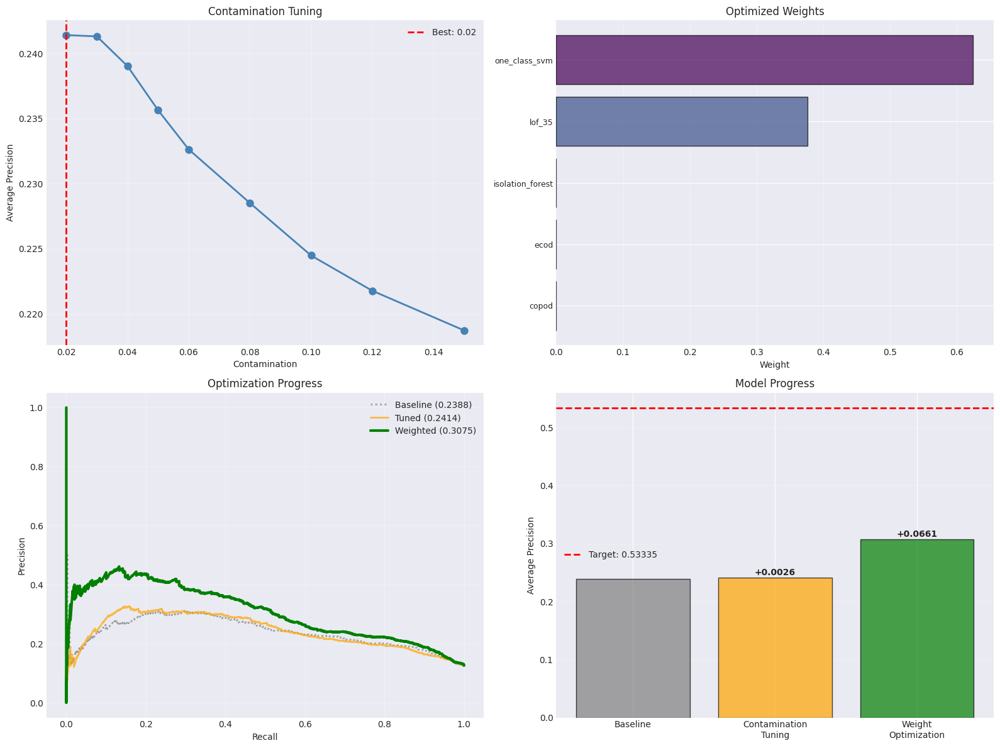

In [ ]:
import json
from datetime import datetime

def optimize_weights(predictions, y_true):
    best_ap = 0
    best_weights = {name: 1/len(predictions) for name in predictions}
    
    weight_options = np.arange(0.0, 1.05, 0.05)
    model_names = list(predictions.keys())
    
    current_weights = {name: 1/len(predictions) for name in predictions}
    current_ap = average_precision_score(y_true, ensemble_predictions(predictions, current_weights))
    
    improved = True
    max_iterations = 100
    iteration = 0
    
    while improved and iteration < max_iterations:
        improved = False
        iteration += 1
        
        for model in model_names:
            for weight in weight_options:
                test_weights = current_weights.copy()
                test_weights[model] = weight
                
                weight_sum = sum(test_weights.values())
                if weight_sum == 0:
                    continue
                for m in model_names:
                    test_weights[m] /= weight_sum
                
                ensemble_scores = ensemble_predictions(predictions, test_weights)
                ap = average_precision_score(y_true, ensemble_scores)
                
                if ap > current_ap + 1e-8:
                    current_ap = ap
                    current_weights = test_weights.copy()
                    improved = True
                    best_ap = ap
                    best_weights = test_weights.copy()
            
            if improved:
                break
    
    return best_weights

# Test contamination values
print("\nTuning contamination parameter:")
contamination_results = {}

for contamination in [0.02, 0.03, 0.04, 0.05, 0.06]:
    models = train_ensemble(X_train_best, contamination)
    predictions = get_predictions(models, X_valid_best)
    ensemble_scores = ensemble_predictions(predictions)
    ap = average_precision_score(y_valid, ensemble_scores)
    contamination_results[contamination] = {'models': models, 'predictions': predictions, 'ap': ap}
    print(f"  {contamination:.2f}: {ap:.6f}")

best_contamination = max(contamination_results, key=lambda k: contamination_results[k]['ap'])
print(f"\nBest contamination: {best_contamination:.2f} (AP: {contamination_results[best_contamination]['ap']:.6f})")

# Get best models and predictions
final_models = contamination_results[best_contamination]['models']
final_predictions = contamination_results[best_contamination]['predictions']
baseline_ap = contamination_results[best_contamination]['ap']

# Optimize ensemble weights
print("\nOptimizing ensemble weights:")
best_weights = optimize_weights(final_predictions, y_valid)

print("\nOptimized weights:")
for name, weight in sorted(best_weights.items(), key=lambda x: x[1], reverse=True):
    print(f"  {name:20s}: {weight:.4f}")

# Final ensemble with optimized weights
final_ensemble_scores = ensemble_predictions(final_predictions, best_weights)
final_ap = average_precision_score(y_valid, final_ensemble_scores)

print(f"\nBaseline (equal weights):       {baseline_ap:.6f}")
print(f"After weight optimization:      {final_ap:.6f}")
print(f"Improvement:                    +{final_ap - baseline_ap:.6f}")

# Generate test predictions
test_predictions = get_predictions(final_models, X_test_best)
test_ensemble_scores = ensemble_predictions(test_predictions, best_weights)
test_probs = stats.beta.cdf(test_ensemble_scores, 0.5, 0.5)

submission = pd.DataFrame({'Id': test_df.index, 'target': test_probs})
submission.to_csv('feature_engineered_predictions.csv', index=False)
print("\nSaved: feature_engineered_predictions.csv")

# Save config
config = {
    'timestamp': datetime.now().strftime("%Y%m%d_%H%M%S"),
    'baseline_ap': float(baseline_ap),
    'final_ap': float(final_ap),
    'feature_groups': [name for name, _ in best_combination],
    'n_features': int(X_train_best.shape[1]),
    'best_contamination': float(best_contamination),
    'model_weights': {k: float(v) for k, v in best_weights.items()}
}

with open(f"config_{config['timestamp']}.json", 'w') as f:
    json.dump(config, f, indent=2)
print(f"Saved: config_{config['timestamp']}.json")

## Citations and Sources

The sources used in this analysis:

- Source1: http://hdl.handle.net/1822/14838
- Source2: https://github.com/cs109/2015/blob/master/Lectures/01-Introduction.pdf